In [156]:
import os
import io
import sys
import re
import statistics
import traceback

from typing import Literal

import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import pickle
import json
import torch
import torch.nn as nn
from torch.nn import CrossEntropyLoss, BCELoss
import torch.nn.functional as F 
from torch import optim
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler
from torchmetrics.classification import BinaryF1Score, BinaryPrecision, BinaryRecall, BinaryAccuracy, MulticlassF1Score
from sklearn.metrics import f1_score
from pprint import pprint

from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import KFold
# from sklearn import metrics
%matplotlib inline

import seaborn as sns
import matplotlib.pyplot as plt

from typing import Literal



In [157]:
sys.path.append(os.path.dirname('../src/'))
from utils.train_utils import *
from utils.models import MultiTaskBERT
from utils.datasets import *

In [158]:
from joan_utils.clusters_utils import *
from joan_utils.train_utils import *
from joan_utils.dataset import *

In [159]:
path_to_models_runs = '../results/'
path_to_ge_ghc_data = f'../data/matching_sizes_data/'
path_to_sc_data = '../data/sc_filtered_from_bela/'

In [160]:
emotions = ['anger','disgust','fear','joy','sadness','surprise']

# Explanations  

- use the dataframe anno_scal_res_all_mean to look up results

# helper functions

In [7]:
def get_annos(df):
    annos = [y for y in df.columns if re.fullmatch(r'[0-9]*',y)]
    return(annos)

In [8]:

#these functions are only used internally

def __load_results_dict(path):
    with open(path + '/model_results.json', 'r') as file:
         return json.load(file)
     
def __load_preds_and_labels(path):
    with open(path+ '/model_preds_and_labels.pkl', 'rb') as file:
         return pickle.load(file)

# these are to use 

def return_results_df(path_to_file_or_dir, path_to_subdir=None):#path_to_runs, model_run):
    if path_to_subdir:
        # if 'sc' in path_to_subdir.lower:
        path_to_res = path_to_file_or_dir + path_to_subdir+ '/model_results.json'
        path_to_hyps = path_to_file_or_dir + path_to_subdir+ '/hyper_parameters.json'
    else: 
        path_to_res = path_to_file_or_dir
        path_to_hyps = path_to_file_or_dir.removesuffix('model_results.json') +  'hyper_parameters.json'
    
    with open(path_to_res, 'r') as file:
         res_df =  pd.DataFrame(json.load(file)).transpose()
    
    if os.path.exists(path_to_hyps):
        with open(path_to_hyps, 'r') as file:
            hyps_dict =  json.load(file)
    
    res_df.loc['sum',:] = res_df.sum()
    res_df.loc['epoch_mean',:] = res_df[res_df.index.str.lower().str.contains('epoch')].mean()
    res_df.loc['test_mean',:] = res_df[res_df.index.str.lower().str.contains('test')].mean()
    res_df.loc['test_results_std_dev',:] = np.std(res_df[res_df.index.str.lower().str.contains('test')], ddof=0)
    if os.path.exists(path_to_hyps) and 'num_comments_per_anno_train' in hyps_dict.keys():
        res_df.loc['hyperparameters','comments_per_annotator'] = hyps_dict['num_comments_per_anno_train']
    
    return res_df

def return_hyperparams(path_to_runs, model_run):
    with open(path_to_runs + model_run+'/hyper_parameters.json', 'r') as file:
        return json.load(file)
    
def print_hyperparams(path_to_runs, model_run, without_anno_ids=True):
    hp_dict = return_hyperparams(path_to_runs, model_run)
    if without_anno_ids:
        hp_dict['annotator_ids'] = 'REMOVED for better visualization'
    pprint(hp_dict)
    
def load_and_display_res_df_color(path_to_models_runs, run, filter_cols=None):
    df = return_results_df(path_to_models_runs, run)
    if filter_cols:
        df = df[[x for x in df.columns if any([s in x for s in filter_cols])]]
    subset = [col for col in list(df.columns) if re.search(r'(train|test|val)s?_(loss|f1)s?', col)]
    display(df.style.background_gradient(cmap ='YlGn', subset=subset).format(precision=3))
    
def results_of_folder(path_to_dir):
    runs = sorted(os.listdir(path_to_dir), key=lambda s: [float(x) for x in re.findall(r'\de-\d\d|\d\.\d+|\d+',s)], reverse=True)
    
    all_res = pd.DataFrame(columns=['run', 'test_f1_majority_macro', 'test_f1_majority_binary', 'test_f1_individual_binary', 'test_f1_individual_macro', 'test_acc']) #seconds_per_epoch

    for run in runs:
        try:
            hypers = return_hyperparams(path_to_dir, run) #time_millis
            #seconds = hypers['time_millis']/1000
            res_df = return_results_df(path_to_dir, run)
            test_f1 = res_df.loc['Test_results','test_f1s']
            test_f1_majority_macro = res_df.loc['Test_results','test_f1_majority_macro']
            test_f1_majority_binary = res_df.loc['Test_results','test_f1_majority_binary']
            test_f1_individual_binary = res_df.loc['Test_results','test_f1_individual_binary']
            test_f1_individual_macro = res_df.loc['Test_results','test_f1_individual_macro']
            test_acc = res_df.loc['Test_results','test_accs']
            num_epochs = len(res_df[res_df.index.str.lower().str.contains('epoch')])
            #run_time = seconds/num_epochs
            all_res.loc[len(all_res),:] = [run, test_f1_majority_macro, test_f1_majority_binary, test_f1_individual_binary, test_f1_individual_macro, test_acc] #,run_time
        except Exception as e:
            print(e)
    
    return all_res

def results_of_folder_ge(path_to_dir):
    runs = sorted(os.listdir(path_to_dir), key=lambda s: [float(x) for x in re.findall(r'\de-\d\d|\d\.\d+|\d+',s)], reverse=True)
    
    all_res = pd.DataFrame(columns=['run', 'test_f1', 'test_acc', 'seconds_per_epoch'])

    for run in runs:
        try:
            hypers = return_hyperparams(path_to_dir, run) #time_millis
            seconds = hypers['time_millis']/1000
            res_df = return_results_df(path_to_dir, run)
            test_f1 = res_df.loc['Test_results','test_f1s']
            test_acc = res_df.loc['Test_results','test_accs']
            num_epochs = len(res_df[res_df.index.str.lower().str.contains('epoch')])
            run_time = seconds/num_epochs
            all_res.loc[len(all_res),:] = [run, test_f1, test_acc, run_time]
        except Exception as e:
            print(e)
    
    return all_res

def display_res_df_color(df):
    subset = [col for col in list(df.columns) if re.search(r'(test|val)s?_(loss|f1)s?', col)]
    display(df.style.background_gradient(cmap ='YlGn', subset=subset).format(precision=3))

In [9]:
#functions for loading individual annotators results

def load_preds_labels(path_to_models_runs, model_run):
    with open(path_to_models_runs + model_run+'/model_preds_and_labels.json', 'r') as f:
        return json.load(f)

def get_preds_and_labels(data_dict, fold=0, epoch=0):
    preds = data_dict[f"Fold{fold}_epoch{epoch}"]['all_test_preds']
    labels = data_dict[f"Fold{fold}_epoch{epoch}"]['all_test_labels']
    if preds.device.type=='cuda':
        preds = preds.to('cpu')
        labels = labels.to('cpu')
    return preds, labels

def get_best_epoch(majority_results, measure='test_f1'):
    return max(majority_results.index, key=majority_results.test_f1.__getitem__)

def get_scores_annotators(res_dict, epoch):
    num_annotators = res_dict[epoch]['all_test_preds'][0].shape[0]

    preds = torch.stack(res_dict[epoch]['all_test_preds']).to('cpu')
    labels = torch.stack(res_dict[epoch]['all_test_labels']).to('cpu')

    bin_f1_score = BinaryF1Score()
    bin_acc = BinaryAccuracy()

    df = pd.DataFrame(columns=['F1','ACC'])
    
    for i in range(num_annotators):
        p = preds[:,i]
        l = labels[:,i]
        mask = l.ge(0)
        acc = f1 = float('nan')
        if any(mask):
            mask_p = torch.masked_select(p,mask)
            mask_l = torch.masked_select(l,mask)
            acc = round(bin_acc(mask_p,mask_l).item(),3)
            f1 = round(bin_f1_score(mask_p,mask_l).item(),3)
        df.loc[i] = [f1,acc]
    
    l = labels.transpose(0,1).tolist()
    zeros = [a.count(0) for a in l]
    ones = [a.count(1) for a in l]

    df['0'] = zeros
    df['1'] = ones
    df['count'] = df['0'] + df['1']
    
    return df

In [10]:

# multi result dataframe
def get_multi_runs_res_df(path_to_runs, run_list, path_to_sc_data, path_to_ge_ghc_data, provided_dataset_model_name=None, lr_search=False, num_annos=None, dataset_name=None):
    multi_df = pd.DataFrame(columns=['dataset_name','ds_name','model', 'dataset_size', 'number_annotations', 'num_annos', 
                                     'f1_bin_maj', 'f1_macro_maj', 'f1_bin_indi', 'f1_macro_indi', 
                                     'test_acc_maj', 'test_acc_indi', 'mean_train_millis', 
                                     'mean_train_millis_per_annotation', 'mean_train_millis_per_sample', 
                                     'mean_eval_millis_per_annotation', 'mean_test_millis_per_annotation', 'sum_all_millis', 
                                     'annotations_per_anno', 'comment_percentage', 'learning_rate','fold'])
    num_annos_provided = bool(num_annos)
    #multi-tasking-sbert

    missing = []
    
    for run in run_list:
        # if 'multi-tasking-sbert': 
        if run[-1] in [0,1,2,3,4]:
            fold = run[-1]
        else:
            fold = 'no fold'
            
        if not num_annos_provided:
            num_annos = int(re.findall(r"\d+_annos",run)[0].split('_')[0])
        
        percentag_matches = re.findall(r"\d+_percentage",run)
        with_percentage = bool(percentag_matches)
        
        if with_percentage:
            comment_percentage = int(percentag_matches[0].split('_')[0])
            
        if lr_search:
            if '.' in run:
                lr = float(re.findall(r"\d.\d+",run)[0])
            else:
                lr = float(re.findall(r"\de-\d+",run)[0])
         
        emotion_str = ''      
        if "'" in run:
            emotion = run.split("'")[1].split('-')[0]
            emotion_str = f"'{emotion}"
                
        try:
            # if provided_dataset_model_name: 
            if 'GE' in run:
                dataset_name = 'GE'
            elif 'ghc' in run.lower():
                dataset_name = 'GHC' 
            elif 'sc' in run.lower():
                dataset_name = 'sc' 
            elif 'md' in run.lower():
                dataset_name = 'MD' 
            elif 'ConvAbuse' in run:
                dataset_name = 'ConvAbuse' 
            elif 'HSBrexit' in run:
                dataset_name = 'HSBrexit' 
            elif 'ArMIS' in run:
                dataset_name = 'ArMIS' 
        #     dataset_model_name = provided_dataset_model_name
        # else:
        #     dataset_name = run.split('-')[0]
            dataset_model_name = run.split('_')[0]
            model_name = '-'.join(dataset_model_name.split('-')[1:])
            
            if dataset_name.lower() == 'sc': 
                path_to_dataset = f'{path_to_sc_data}sc_{num_annos}_annos_filtered.csv'
                with open(path_to_dataset, 'r') as f:
                    dataframe = pd.read_csv(f)
                dataset_size = len(dataframe)
            else:
                if ('comment_scalability' in path_to_runs and not any([x in run.lower() for x in ['md','convabuse','armis','hsbrexit']])) or 'full_' in path_to_runs:
                    path_to_dataset = f'{path_to_ge_ghc_data}{dataset_name}{emotion_str}*full_{num_annos}_annos_filtered.csv'
                    with open(path_to_dataset, 'r') as f:
                        dataframe = pd.read_csv(f)
                    dataset_size = len(dataframe)
                else:
                    path_to_dataset = f'{path_to_ge_ghc_data}{dataset_name}{emotion_str}_{num_annos}_annos_filtered.csv'
                    with open(path_to_dataset, 'r') as f:
                        dataframe = pd.read_csv(f)
                    dataset_size = len(dataframe)
        
        # if provided_dataset_model_name:# any([x in provided_dataset_model_name.lower() for x in ['udi','ae','aa']]):
        #     res_df = return_results_df(path_to_runs + run)
        # else:
            res_df = return_results_df(path_to_runs, run)     
               #'../results/multi_scalability_0/SC-multi-tasking-sbert_6_annos/model_results.json' 
            # dataset_size = res_df.loc['test_mean','dataset_size']
            number_annotations = res_df.loc['test_mean','number_of_annotations']
                
            mean_train_millis_epoch = res_df.loc['epoch_mean','train_time_millis']
            mean_train_millis_per_annotation = mean_train_millis_epoch/number_annotations
            mean_train_millis_per_sample = mean_train_millis_epoch/dataset_size
            mean_eval_millis_per_annotation = res_df.loc['epoch_mean','eval_time_millis']/number_annotations
            mean_test_millis_per_annotation = res_df.loc['epoch_mean','test_time_millis']/number_annotations
            f1_bin_maj = res_df.loc['test_mean','test_f1_majority_binary']
            f1_macro_maj = res_df.loc['test_mean','test_f1_majority_macro']
            f1_bin_indi = res_df.loc['test_mean','test_f1_individual_binary']
            f1_macro_indi = res_df.loc['test_mean','test_f1_individual_macro']
            test_acc_maj = res_df.loc['test_mean','test_acc_majority']
            test_acc_indi = res_df.loc['test_mean','test_acc_individual']
            sum_all_millis = res_df.loc['sum','train_time_millis'] + res_df.loc['sum','eval_time_millis'] + res_df.loc['sum','test_time_millis']

            i = len(multi_df) 
                               #['dataset_name''dataset_size','number_annotations', 'num_annos', 'f1_bin_maj''f1_macro_maj''f1_bin_indi''f1_macro_indi''test_acc_maj''test_acc_indi', 'mean_train_millis',  'mean_train_millis_per_annotation','mean_train_millis_per_sample''mean_eval_millis_per_annotation''mean_test_millis_per_annotation''sum_all_millis','annotations_per_anno', 'lr]
            multi_df.loc[i,:] = [dataset_model_name,dataset_name,model_name, dataset_size, number_annotations, num_annos, f1_bin_maj, f1_macro_maj, f1_bin_indi, f1_macro_indi, test_acc_maj, test_acc_indi, mean_train_millis_epoch, mean_train_millis_per_annotation, mean_train_millis_per_sample, mean_eval_millis_per_annotation, mean_test_millis_per_annotation, sum_all_millis, None, None, None, fold]

            if with_percentage:
                multi_df.loc[i,'annotations_per_anno'] = res_df.loc['hyperparameters','comments_per_annotator']
                multi_df.loc[i,'comment_percentage'] = comment_percentage
                
            if lr_search:
                multi_df.loc[i,'learning_rate'] = lr
                
                    
        except Exception as e:
            missing.append(run)
            print(print(run))
            print('_'*100)
            print(str(e))
            print('_'*100)
            print(traceback.format_exc())
            
            
    return multi_df, missing

In [303]:
# plot multi result dataframe 

blues = sns.color_palette("Blues",16)
greens = sns.color_palette("Greens",16)
reds = sns.color_palette("Reds",16)
spectral = sns.color_palette("Spectral",16)
purples = sns.color_palette("Purples",10)
oranges = sns.color_palette("Oranges",10)

df_names_color_map = {
    'GHC-multi-tasking': greens[-1], 
    'GHC-multi-tasking-sbert' : greens[-5],
    'GHC-bertbase': greens[-1], 
    'GHC-sbertbase': greens[-8], 
    'GHC-comp' : reds[-5],
    'GHC-compUid' : reds[-4],
    # 'GHC*full-multi-tasking': greens[-15], 
    'GHC-uid': greens[-8],
    'GE-multi-tasking': blues[-1], 
    'GE-multi-tasking-sbert' : blues[-5],
    'GE-bertbase': blues[-1], 
    'GE-uid': blues[-8], 
    'GE-sbertbase': blues[-8], 
    'GE-comp' : reds[-5],
    'GE-compUid' : reds[-4],
    # 'GE*full-multi-tasking': blues[-13], 
    'SC-multi-tasking': reds[-1], 
    'SC-multi-tasking-sbert' : reds[-5],
    'SC-bertbase': reds[-1], 
    'SC-ae': reds[-11], 
    'SC-aa': reds[-14], 
    'SC-uid': reds[-8],
    'SC-sbertbase': reds[-8],
    'SC-multi-tasking': reds[-1],
    'SC-multi-tasking-sbert' : reds[-5],
    'SC-comp' : reds[-5],
    'SC-compUid' : reds[-4],
    'SC-bertbase': reds[-1], 
    'SC-ae': reds[-11], 
    'SC-ae': reds[-14], 
    'SC-uid': reds[-8],
    'SC-sbertbase': reds[-8]
}
model_names = ['bertbase','multi-tasking','sbertbase','uid','multi-tasking-sbert']
model_color_values = [-1,-1,-8,-8,-4]
for emotion in emotions:
    for model_name, color in zip(model_names, model_color_values):
        df_names_color_map[f"GE'{emotion}-{model_name}"] = blues[color]
        
for model_name, color in zip(model_names, model_color_values):
        df_names_color_map[f"GE_all_mean-{model_name}"] = blues[color]



df_names_color_map_only_one = {
    'GHC-multi-tasking': spectral[15],
    'GHC-multi-tasking-sbert' : spectral[11], 
    'GHC-bertbase': spectral[14], 
    'GHC-sbertbase': spectral[1], 
    'GHC-uid': spectral[0],
    'GHC-comp': spectral[7],
    'GHC-compUid': spectral[9],
    'MD-multi-tasking': spectral[-1],
    'MD-bertbase': spectral[-2], 
    'MD-sbertbase': spectral[1], 
    'MD-uid': spectral[0],
    'MD-comp': spectral[7],
    'MD-compUid': spectral[9],
    'ArMIS-multi-tasking': spectral[-1],
    'ArMIS-bertbase': spectral[-2], 
    'ArMIS-sbertbase': spectral[1], 
    'ArMIS-uid': spectral[0],
    'ArMIS-comp': spectral[7],
    'ArMIS-compUid': spectral[9],
    'HSBrexit-multi-tasking': spectral[-1],
    'HSBrexit-bertbase': spectral[-2], 
    'HSBrexit-sbertbase': spectral[1], 
    'HSBrexit-uid': spectral[0],
    'HSBrexit-comp': spectral[7],
    'HSBrexit-compUid': spectral[9],
    'ConvAbuse-multi-tasking': spectral[-1],
    'ConvAbuse-bertbase': spectral[-2], 
    'ConvAbuse-sbertbase': spectral[1], 
    'ConvAbuse-uid': spectral[0],
    'ConvAbuse-comp': spectral[7],
    'ConvAbuse-compUid': spectral[9],
    'GE-multi-tasking': spectral[-1], 
    'GE-multi-tasking-sbert' : spectral[-5], 
    'GE-bertbase': spectral[-2], 
    'GE-uid': spectral[0], 
    'GE-sbertbase': spectral[1], 
    'GE-comp': spectral[7],
    'GE-compUid': spectral[9],
    # 'GE*full-multi-tasking': blues[-13], 
    'sc-multi-tasking': spectral[-1], 
    'sc-multi-tasking-sbert' : spectral[-5], 
    'sc-bertbase': spectral[-2], 
    'sc-ae': spectral[3], 
    'sc-aa': spectral[6], 
    'sc-uid': spectral[0],
    'sc-sbertbase': spectral[1],
    'SC-multi-tasking': spectral[15], 
    'SC-multi-tasking-downsized': spectral[6], 
    'SC-multi-tasking-sbert' : spectral[11], 
    'SC-bertbase': spectral[14], 
    'SC-ae': spectral[3], 
    'SC-aa': spectral[6], 
    'SC-uid': spectral[0],
    'SC-sbertbase': spectral[1],
    'SC-multi-tasking-aa-anchor-downsized-6-3':  greens[6],
    'SC-multi-tasking-aa-anchor-downsized-38-5':  greens[12],
    'SC-multi-tasking-aa-anchor-logits-shared-layer-38-5':  'pink',
    'SC-multi-tasking-aa-anchor-logits-6-3':  oranges[4],
    'SC-multi-tasking-aa-anchor-logits-38-5':  oranges[9],
    'SC-uid-aa-anchor-logits-6-3': 'pink',
    'SC-uid-aa-anchor-downsized-6-3': 'orange',
    'SC-comp': spectral[7],
    'SC-compUid': spectral[9],
    

        # 'anchorv2': 'anchor-v2',
        # 'v2': 'downsized',
        # 'v3': 'logits-shared-layer',
        # 'v4': 'logits'
}
    
model_names = ['bertbase','multi-tasking','sbertbase','uid','multi-tasking-sbert', 'comp', 'compUid']
model_color_values = [14, 15, 1, 0, 5, 7, 9]
for emotion in emotions:
    for model_name, color in zip(model_names, model_color_values):
        df_names_color_map_only_one[f"GE'{emotion}-{model_name}"] = spectral[color]
    
for model_name, color in zip(model_names, model_color_values):
        df_names_color_map_only_one[f"GE_all_mean-{model_name}"] = spectral[color]

df_names_color_map[f"GE_all_mean-comp"] = blues[-5]
df_names_color_map[f"GE_all_mean-compUid"] = blues[-4]

def get_colors(df, only_one=False):
    if only_one:
        return [df_names_color_map_only_one[x] for x in df.dataset_name.unique()]
    else:
        return [df_names_color_map[x] for x in df.dataset_name.unique()]


def get_y_lim(f1_type:str):
    if 'macro' in f1_type:
        return (0.45,0.8)
    if 'bin' in f1_type:
        return (0.0,0.7)
 
def plot_f1s_multi_df(multi_res_df, 
                      on_x:Literal['num_annos','annotations_per_anno'] = 'num_annos',
                      on_y:Literal['f1_bin_maj','f1_macro_maj','f1_bin_indi','f1_macro_indi','four','two'] = 'f1_macro_indi', 
                      only_ds=None, 
                      only_ds_color_schema=False, 
                      fixed_y_axis=True, 
                      color_schema_auto=False, 
                      set_x_range=False, 
                      no_style=False, 
                      select_models_list=None, 
                      exclude_models_list=None, 
                      plot_data_count=True, 
                      on_y_list=['f1_macro_indi','f1_bin_maj'], 
                      highlight_zero=False,
                      only_few_in_lower_range=False,
                      return_plot=False):
    '''
    Parameters
    ----------
    on_x : str
        one of 'num_annos', 'annotations_per_anno'
    on_y : str
        one of 'f1_bin_maj', 'f1_macro_maj', 'f1_bin_indi', 'f1_macro_indi', 'four', 'two'
        'two' is f1_macro_indi and f1_bin_maj
    only_ds : str
        one of 'GHC', 'GE', 'SC', 'MD'
    only_ds_color_schema : bool
        set this true when plotting the results of only one dataset
    fixed_y_axis : bool
        True for plot having same y range as the others, for comparison,
        False for y range set automatically by seaborn
    color_schema_auto : bool
        set True is you dont want to use the defined color schemas defined above
    set_x_range : bool | touple(int)
        use a touple like (82,2500) to set the x-axis range
    select_models_list : list(string)
        use this to filter for runs, datasets
    exclude_models_list : list(string)
        use this to exclude runs, datasets
    on_y_list : list(string)
        list of length two, containing the on_y strings for the case of plotting two F1 scores
    
    
    '''
    line_style = 'is_baseline'
    if no_style:
        line_style = None
    
    if only_few_in_lower_range:
        remove_annos = list(range(6,19,2)) + list(range(22,83,4)) 
        remove_annos = [x for x in remove_annos if x not in [62,22]]
        multi_res_df = multi_res_df[~multi_res_df.num_annos.isin(remove_annos)]
        
    if select_models_list:
        select_models_list = [x.lower() for x in select_models_list]
        multi_res_df = multi_res_df[multi_res_df.dataset_name.str.lower().str.contains('|'.join(select_models_list))]
        
    if exclude_models_list:
        exclude_models_list = [x.lower() for x in exclude_models_list]
        multi_res_df = multi_res_df[~multi_res_df.dataset_name.str.lower().str.contains('|'.join(exclude_models_list))]
    
    if only_ds:
        multi_res_df = multi_res_df[multi_res_df.dataset_name.str.lower().str.contains(only_ds.lower())]
    
    if color_schema_auto:
        colors=sns.color_palette("tab10")
    elif only_ds or only_ds_color_schema:
        colors = get_colors(multi_res_df, only_one=True)
    else:
        colors = get_colors(multi_res_df)
        
        
    multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')
    
    if on_y == 'four':
        fig, axs = plt.subplots(figsize = (15, 10), nrows=2, ncols=2)
        axs = axs.flatten()
        
        for i, on_y in enumerate(['f1_macro_indi','f1_bin_indi','f1_macro_maj','f1_bin_maj']):
            lnplt = sns.lineplot(data=multi_res_df, x=on_x, y=on_y, hue='dataset_name' ,style=line_style, palette=colors, ax=axs[i])
            if only_ds and plot_data_count:
                ax2 = lnplt.twinx()
                lnplt2 = sns.lineplot(data=multi_res_df, x=on_x, y='dataset_size', ax=ax2, color=(.5,.5,.5)) 
                ax2.set(ylim=(0,max(multi_res_df.dataset_size))) 
            axs[i].set_title(on_y)
            lnplt.legend_.remove()
            axs[i].grid()
            if fixed_y_axis:
                axs[i].set(ylim=get_y_lim(on_y))
            if set_x_range:
                axs[i].set(xlim=set_x_range)
                
        lines, labels = axs[0].get_legend_handles_labels()
        fig.legend(lines, labels, bbox_to_anchor=(1.2, 1.0))
        plt.tight_layout()
        
        if return_plot:
            return (fig, axs)
        
    elif on_y == 'two':
        fig, axs = plt.subplots(figsize = (15, 5), nrows=1, ncols=2)
        
        for i, on_y in enumerate(on_y_list):
            lnplt = sns.lineplot(data=multi_res_df, x=list(multi_res_df[on_x]), y=list(multi_res_df[on_y]), hue='dataset_name' ,style=line_style, palette=colors, ax=axs[i])     
            if only_ds and plot_data_count:
                ax2 = lnplt.twinx()
                lnplt2 = sns.lineplot(data=multi_res_df, x=on_x, y='dataset_size', ax=ax2, color=(.5,.5,.5)) 
                ax2.set(ylim=(0,max(multi_res_df.dataset_size)*1.05))           
            axs[i].set_title(on_y)
            if lnplt.legend_:
                lnplt.legend_.remove()
            axs[i].grid()
            if fixed_y_axis:
                axs[i].set(ylim=get_y_lim(on_y))
            if set_x_range:
                axs[i].set(xlim=set_x_range)
            if highlight_zero:
                axs[i].hlines(y = [0.0], # Y-axis values
                     xmin = min(multi_res_df[on_x]), # From x = -2
                     xmax = max(multi_res_df[on_x]),
                     color='black')
        only_ds_str = 'Multiple Datasets:'
        if only_ds:
            only_ds_str = f"{only_ds}:"
           
        axs[0].set_title(f'{only_ds_str} Macro F1 Macro Individual Annotators')
        axs[1].set_title(f'{only_ds_str} Binary F1 Majority Vote')

        if on_x == 'num_annos':
            axs[0].set_xlabel('Number of annotators')
            axs[1].set_xlabel('Number of annotators')
        else:
            axs[0].set_xlabel('Number of annotations per annotator')
            axs[1].set_xlabel('Number of annotations per annotator')

        axs[0].set_ylabel('Macro F1 Individual')
        axs[1].set_ylabel('Binary F1 Majority Vote')
            
        lines, labels = axs[1].get_legend_handles_labels()
        fig.legend(lines, labels, bbox_to_anchor=(1.2, 1.0))
        plt.tight_layout()

        if return_plot:
            return (fig, axs)
        
    else:
        fig, ax = plt.subplots(figsize = (10, 5))
        
        
        if on_y == 'f1_macro_indi':
            title_str = 'Macro F1 Macro Individual Annotators'
            ax.set_ylabel('Macro F1 Individual')
        elif on_y == 'f1_bin_indi':
            title_str = 'Binary F1 Individual Annotators'
            ax.set_ylabel('Binary F1 Individual')
        elif on_y == 'f1_macro_maj':
            title_str = 'Macro F1 Macro Majority Vote'
            ax.set_ylabel('Macro F1 Majority Vote')
        elif on_y == 'f1_bin_maj':
            title_str = 'Binary F1 Majority Vote'
            ax.set_ylabel('Binary F1 Majority Vote')
         
        only_ds_str = 'Multiple datasets: '
        if only_ds:
            only_ds_str = f"{only_ds}: "   
        plt.title(f"{only_ds_str}{title_str}")

        if on_x == 'num_annos':
            axs.set_xlabel('Number of annotators')
        else:
            axs.set_xlabel('Number of annotations per annotator')


        lnplt = sns.lineplot(data=multi_res_df, x=list(multi_res_df[on_x]), y=list(multi_res_df[on_y]), hue='dataset_name' ,style=line_style, palette=colors, ax=ax)     
        if only_ds and plot_data_count:
            ax2 = lnplt.twinx()
            lnplt2 = sns.lineplot(data=multi_res_df, x=on_x, y='dataset_size', ax=ax2, color=(.5,.5,.5)) 
            ax2.set(ylim=(0,max(multi_res_df.dataset_size)*1.05))           
        ax.set_title(on_y)
        if lnplt.legend_:
            lnplt.legend_.remove()
        ax.grid()
        if fixed_y_axis:
            ax.set(ylim=get_y_lim(on_y))
        if set_x_range:
            ax.set(xlim=set_x_range)
        if highlight_zero:
            ax.hlines(y = [0.0], # Y-axis values
                    xmin = min(multi_res_df[on_x]), # From x = -2
                    xmax = max(multi_res_df[on_x]),
                    color='black')
        
        sns.move_legend(lnplt, "upper left", bbox_to_anchor=(1.2, 1))
        
        if fixed_y_axis:
            ax.set(ylim=get_y_lim(on_y))
        if set_x_range:
            ax.set(xlim=set_x_range)
            
        ax.grid()
        
        if return_plot:
            return (fig, ax)
        

    
def plot_train_time_multi_df(df, per, select_models_list=None, exclude_models_list=None, plot_data_count=False, plot_annotations_count=False, annotation_as_x=False):
    """
    Parameters
    ----------
    df : pandas.DataFrame
        
    per : str
        either 'sample', 'annotation', 'epoch' or 'all' to plot time per divided by nummber of samples or annotations or per epoch or total sum.
    """
    fig, ax = plt.subplots(figsize = (7, 4))
    
    df['is_baseline'] = df.dataset_name.str.lower().str.contains('base')
    
    if select_models_list:
        select_models_list = [x.lower() for x in select_models_list]
        df = df[df.dataset_name.str.lower().str.contains('|'.join(select_models_list))]
        
    if exclude_models_list:
        exclude_models_list = [x.lower() for x in exclude_models_list]
        df = df[~df.dataset_name.str.lower().str.contains('|'.join(exclude_models_list))]
        
    x = 'num_annos'
        
    if per == 'sample':
        y = 'mean_train_millis_per_sample'
        title = 'Mean Train Millis per epoch per sample'
    # elif per == 'annotation':
    #     y = 'mean_train_millis_per_annotation'
    #     title = 'Mean train millis per epoch per annotations'
    elif per == 'annotation':
        y = 'mean_train_millis'
        y_new = 'mean_train_millis_per_annotation'
        df[y_new] = df[y] / df['number_annotations']
        title = 'Mean train millis per epoch per annotation'
        y = y_new
    elif per == 'epoch':
        y = 'mean_train_millis'
        y_new = 'mean_train_minutes'
        df[y_new] = df[y] / 1000 / 60
        title = 'Mean Train minutes per epoch'
        y = y_new
    elif per == 'all':
        y = 'sum_all_millis'
        title = 'Sum of all Train, Val, Test Millis'
        
    plt.title(title)
    
    if annotation_as_x:  
        p1 = sns.lineplot(
            data=df, 
            x=list(df.number_annotations),
            y=y,
            hue='dataset_name',
            style='is_baseline',
            palette=get_colors(df),
            ax=ax)
        ax.set(xlabel='number of annotations in train set')
    else:
        p1 = sns.lineplot(
            data=df, 
            x=x,
            y=y,
            hue='dataset_name',
            style='is_baseline',
            palette=get_colors(df),
            ax=ax)
    
    if plot_data_count:
        ax2 = p1.twinx()
        lnplt2 = sns.lineplot(data=df, x=df.num_annos, y='dataset_size', ax=ax2, color=(.5,.5,.5)) 
        ax2.set(ylim=(0,max(df.dataset_size)*1.05))     
    
    elif plot_annotations_count:
        ax2 = p1.twinx()
        lnplt2 = sns.lineplot(data=df, x=df.num_annos, y='number_annotations', ax=ax2, color=(.5,.5,.5)) 
        ax2.set(ylim=(0,max(df.number_annotations)*1.05))     
    
    p1.legend_.remove()
    ax.grid()
    
    lines, labels = ax.get_legend_handles_labels()
    fig.legend(lines, labels, bbox_to_anchor=(1.1, 1.0))
    plt.tight_layout()

    sns.move_legend(fig, "upper left", bbox_to_anchor=(1, 1))

In [12]:
# plot individual annotators results

def display_all_f1_plots(anno_res):
    fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(9, 6))
    for i, attr in enumerate(['ACC','0','1','count']):
        sns.scatterplot(data=anno_res, x=attr, y='F1', ax=ax[(i//3, i%3)], color=sns.color_palette()[i])
    sns.scatterplot(data=anno_res, x=anno_res['0']/anno_res['1'], y='F1', ax=ax[(1,1)]).set(xlabel = 'ratio 0s to 1s')
    fig.tight_layout()
    plt.figure()

def display_boxplot_anno_f1s(anno_res):
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 3))
    sns.color_palette("rocket", as_cmap=True)
    sns.boxplot(data=anno_res, x='F1', boxprops={'alpha': 0.4}, ax=ax)
    sns.stripplot(data=anno_res, x='F1', color='red', ax=ax)
    plt.figure()

def plot_all_single_annotators(anno_res):
    load_and_display_res_df_color(anno_res, subset=None)
    display_all_f1_plots(anno_res)
    display_boxplot_anno_f1s(anno_res)

def show_GE_plots(path_to_emotions, emotion, model_run):
    path_to_emotion = path_to_emotions+f"{emotion}/"

    print('#'*100)
    print(' '*35 + emotion + ' '*5 + model_run)
    print('#'*100)

    majority_results = return_results_df(path_to_emotion,model_run)
    res_dict = load_preds_labels(path_to_emotion, model_run)
    epoch = get_best_epoch(majority_results)

    anno_res = get_scores_annotators(res_dict,epoch)
    anno_res = anno_res.sort_values(by='F1')

    plot_all_single_annotators(anno_res)

In [13]:
def get_runs_scaling_annos(path, max_annos, min_annos=0, exact=False):
    runs = [run for run in os.listdir(path) if ('annos' in run and int(re.findall(r'\d+_annos',run)[0].split('_')[0]) <= max_annos and int(re.findall(r'\d+_annos',run)[0].split('_')[0]) >= min_annos)]
    if exact:
        runs = [run for run in runs if int(re.findall(r'\d+_annos',run)[0].split('_')[0]) == max_annos]
    runs = sorted(runs, key=lambda run: (int(re.findall(r'\d+', run)[0]), run.split('_')[0]))
    return runs

def get_all_res_as_df(num_annotators, min_annos=0, only_df:Literal[False,'sc','GE','GHC','MD']=False, comments:Literal['','comment_']='', path_to_models_runs='../results/', path_to_ge_ghc_data='../data/matching_sizes_data/', path_to_sc_data='../data/sc_filtered_from_bela/', ignore_list:list=[]):
    res_df_list = []
    missings = dict()
    for model_type in ['perso','multi']:
        for i in range(5):
            #multi-tasking-sbert
            path_to_runs = f"{path_to_models_runs}{model_type}_{comments}scalability_{i}/"
            filtered_run_list = get_runs_scaling_annos(path_to_runs, num_annotators, min_annos=min_annos)
            if comments=='comment_':
                filtered_run_list = get_runs_scaling_annos(path_to_runs, num_annotators, min_annos=min_annos, exact=True)
            if only_df:
                filtered_run_list = [r for r in filtered_run_list if only_df.lower() in r.lower()]
            filtered_run_list = [x for x in filtered_run_list if not any([ig in x for ig in ignore_list])]
            # print(filtered_run_list)
            res_df, missing = get_multi_runs_res_df(path_to_runs, filtered_run_list, path_to_sc_data, path_to_ge_ghc_data)
            res_df['fold'] = [i]*len(res_df)
            res_df_list.append(res_df)
            missings[i] = missing
    all_explo_res = pd.concat(res_df_list, ignore_index=True)
    all_explo_res = all_explo_res.convert_dtypes()
    all_explo_res.num_annos = all_explo_res.num_annos.astype(int)
    # if comments:
    #     all_explo_res.annotations_per_anno = all_explo_res.annotations_per_anno.astype(int)
    return all_explo_res, missings

def get_means_of_folds(res_df, is_comments_df=False, is_abs_diff_df=False):
    for n, t in res_df.dtypes.items():
        if t not in ['int64','float64'] and n not in ['dataset_name','annotations_per_anno']:
            res_df = res_df.drop(n, axis=1)
    if is_comments_df or is_abs_diff_df:
        return res_df.groupby(['dataset_name','annotations_per_anno']).mean().reset_index()
    else:
        return res_df.groupby(['dataset_name','num_annos']).mean().reset_index()

In [14]:
def fill_missing_y_values(X:list, Y:list):
    sorted_vals = [list(e) for e in zip(*sorted(zip(X,Y)))]
    X = [int(x) for x in sorted_vals[0]]
    Y = sorted_vals[1]
    # print(X)
    # print(Y)
    new_X, new_Y = [], []
    whole_anno_vals = list(range(X[0], X[-1]+1))
    idx = 0
    for x in whole_anno_vals:
        if x in X:
            if x != X[0]:
                idx +=1
            new_X.append(x)
            new_Y.append(Y[idx])
        else:
            lower = X[idx]
            upper = X[idx+1]
            rel_upper, rel_x = upper-lower, x-lower
            rat_upper = rel_x/rel_upper
            rat_lower = 1 - rat_upper
            y_val = Y[idx]*rat_lower + Y[idx+1]*rat_upper
            new_X.append(x)
            new_Y.append(y_val)
    return new_X, new_Y

def get_df_with_missing_x_y_values(df):
    df = df[['dataset_name','annotations_per_anno','f1_macro_indi','f1_bin_maj', 'num_annos', 'fold', 'is_baseline']]
    res_df = pd.DataFrame(columns=df.columns)
    ds_names = set(df.dataset_name)
    for fold in [0,1,2,3,4]:
        for ds_name in ds_names:
            ds_df = df[(df.dataset_name==ds_name) & (df.fold==fold)]
            X = list(ds_df['annotations_per_anno'])
            Y_indi = list(ds_df['f1_macro_indi'])
            Y_maj = list(ds_df['f1_bin_maj'])
            # display(ds_df)
            # print(X)
            # print(Y_indi)
            X_new, Y_indi_new = fill_missing_y_values(X, Y_indi)
            _ , Y_maj_new = fill_missing_y_values(X, Y_maj)
            ds_name_list = [ds_name]*len(X_new)
            fold_list = [fold]*len(X_new)
            num_annos_list = [ds_df.iloc[0,:].num_annos]*len(X_new)
            is_baseline_list = [ds_df.iloc[0,:].is_baseline]*len(X_new)
            append_df = pd.DataFrame([ds_name_list, X_new, Y_indi_new, Y_maj_new, num_annos_list, fold_list, is_baseline_list])
            append_df = append_df.transpose()
            append_df.columns =df.columns
            # print(append_df)
            res_df = pd.concat([res_df, append_df], ignore_index=True)
        
    return res_df
        
        
def get_differences_50_14(df):
    df = get_df_with_missing_x_y_values(df)
    df['dataset_name_norm'] = ['_'.join(x.split('_')[:-1]) for x in df.dataset_name]
    ds_names_norms = set(df.dataset_name_norm)

    res_df = pd.DataFrame(columns=['dataset_name', 'annotations_per_anno', 'abs_diff_f1_macro_indi', 'abs_diff_f1_bin_maj','is_baseline'])
    for fold in [0,1,2,3,4]:
        for ds_name in ds_names_norms:
            ds_df_14 = df[(df.dataset_name_norm==ds_name) & (df.fold==fold) & (df.num_annos==14)]
            ds_df_50 = df[(df.dataset_name_norm==ds_name) & (df.fold==fold) & (df.num_annos==50)]
            ds_df_14 = ds_df_14[ds_df_14.annotations_per_anno.isin(ds_df_50.annotations_per_anno)]
            ds_df_50 = ds_df_50[ds_df_50.annotations_per_anno.isin(ds_df_14.annotations_per_anno)]
            annotations_per_anno_list = list(ds_df_14.annotations_per_anno)
            is_baseline_list = list(ds_df_14.is_baseline)
            diffrences_indi = list(ds_df_50.reset_index().f1_macro_indi - ds_df_14.reset_index().f1_macro_indi)
            diffrences_maj = list(ds_df_50.reset_index().f1_bin_maj - ds_df_14.reset_index().f1_bin_maj)
            append_df = pd.DataFrame([[ds_name]*len(diffrences_indi), annotations_per_anno_list, diffrences_indi, diffrences_maj, is_baseline_list])
            append_df = append_df.transpose()
            append_df.columns =res_df.columns
            res_df = pd.concat([res_df, append_df], ignore_index=True)
    return res_df
            

In [15]:
def rm_emos_to_mean_df(rm_df, is_comment_df=False):
    if not is_comment_df:
        a = rm_df.drop(columns=['ds_name','model']).groupby(['dataset_name','fold','num_annos']).mean().reset_index()
        b = rm_df.groupby(['dataset_name','fold','num_annos']).first().reset_index()[['model','ds_name']]
    else:
        a = rm_df.drop(columns=['ds_name','model']).groupby(['dataset_name','fold','comment_percentage']).mean().reset_index()
        b = rm_df.groupby(['dataset_name','fold','comment_percentage']).first().reset_index()[['model','ds_name']]
    return pd.concat([a,b], axis=1)

In [35]:
# because it sometimes varies for 1 (e.g. 73 and 74 annotations)
def correct_annotations_per_annos(df):
    df['annotations_per_anno'] = df[['dataset_name','comment_percentage','annotations_per_anno']].groupby(['dataset_name','comment_percentage']).transform('median')['annotations_per_anno']
    return df

def remove_GE_emotion_from_name(df, emotions=['anger','disgust','fear','joy','sadness','surprise'], is_comment_df=False):
    
    df_copy = df.copy()
    df_copy.dataset_name = df_copy.dataset_name.str.replace(r"'[^-x]*-","_all_mean-", regex=True) # e.g. GE'anger-uid -> GE-uid
    if is_comment_df:
        df_copy = correct_annotations_per_annos(df_copy)
    return df_copy

# scaling number of annotators exploration

In [66]:
path_to_ge_ghc_data = f'../data/matching_sizes_data/'
path_to_sc_data = '../data/sc_filtered_from_bela/'

In [374]:
# anno_scal_res_all, missing_all = get_all_res_as_df(2500, ignore_list=['multi-tasking-sbert'])
# anno_scal_res_all.to_csv('dataframes_for_plots/all_scal_annos_res.csv')

In [381]:
'''
this dataframe contains all the loaded results from scaling the number of annotators. running the code above takes > 10 minutes..

but for GE and GHC, these are the reduced subsets.
(to meet the number of samples from the corresponding SC subsets, having the same number of annotators)


The results for GHC and GE full (not reduced) are loaded in place, where they are used to plot.

The results for scaling the number of annotations per annotator are also loaded in place where they are needed.
'''

anno_scal_res_all = pd.read_csv('dataframes_for_plots/all_scal_annos_res.csv')

In [382]:
anno_scal_res_all_mean = get_means_of_folds(anno_scal_res_all)

In [386]:
anno_scal_res_all_mean[anno_scal_res_all_mean.dataset_name.str.contains('ArMIS')][['dataset_name','num_annos','dataset_size','number_annotations']]

,dataset_name,num_annos,dataset_size,number_annotations
0,ArMIS-bertbase,1,943.0,943.0
1,ArMIS-bertbase,2,943.0,943.0
2,ArMIS-bertbase,3,943.0,943.0
3,ArMIS-comp,1,943.0,943.0
4,ArMIS-comp,2,943.0,1886.0
5,ArMIS-comp,3,943.0,2829.0
6,ArMIS-compUid,1,943.0,943.0
7,ArMIS-compUid,2,943.0,1886.0
8,ArMIS-compUid,3,943.0,2829.0
9,ArMIS-multi-tasking,1,943.0,943.0


In [387]:
anno_scal_res_all_ge_mean = remove_GE_emotion_from_name(anno_scal_res_all)
anno_scal_res_all_ge_mean = get_means_of_folds(anno_scal_res_all_ge_mean)

In [388]:
# containing the individual folds
anno_scal_res_all.head(4)

,Unnamed: 0,dataset_name,ds_name,model,dataset_size,number_annotations,num_annos,f1_bin_maj,f1_macro_maj,f1_bin_indi,...,mean_train_millis,mean_train_millis_per_annotation,mean_train_millis_per_sample,mean_eval_millis_per_annotation,mean_test_millis_per_annotation,sum_all_millis,annotations_per_anno,comment_percentage,learning_rate,fold
0,0,ArMIS-comp,ArMIS,comp,943,943,1,0.532374,0.630204,0.532374,...,5434.134618,5.762603,5.762603,2.735479,NaN,82814.051488,NaN,NaN,NaN,0
1,1,ArMIS-compUid,ArMIS,compUid,943,943,1,0.520548,0.609412,0.520548,...,5653.903469,5.995656,5.995656,2.855802,NaN,86158.460118,NaN,NaN,NaN,0
2,2,ArMIS-sbertbase,ArMIS,sbertbase,943,943,1,0.578616,0.636340,0.578616,...,5586.876181,5.924577,5.924577,2.819114,NaN,85107.451057,NaN,NaN,NaN,0
3,3,ArMIS-uid,ArMIS,uid,943,943,1,0.621469,0.644068,0.621469,...,5734.769805,6.081410,6.081410,2.847428,NaN,86890.095967,NaN,NaN,NaN,0


In [389]:
# mean of folds
anno_scal_res_all_mean.head(4)

,dataset_name,num_annos,Unnamed: 0,dataset_size,number_annotations,f1_bin_maj,f1_macro_maj,f1_bin_indi,f1_macro_indi,test_acc_maj,...,mean_train_millis,mean_train_millis_per_annotation,mean_train_millis_per_sample,mean_eval_millis_per_annotation,mean_test_millis_per_annotation,sum_all_millis,annotations_per_anno,comment_percentage,learning_rate,fold
0,ArMIS-bertbase,1,6744.0,943.0,943.0,0.509177,0.487945,0.509177,0.487945,0.548148,...,2353.822330,2.496100,2.496100,0.346610,NaN,12115.229415,NaN,NaN,NaN,2.0
1,ArMIS-bertbase,2,6750.0,943.0,943.0,0.443515,0.498252,0.396298,0.504819,0.559788,...,2439.167143,2.586604,2.586604,0.376220,NaN,12679.288262,NaN,NaN,NaN,2.0
2,ArMIS-bertbase,3,6756.0,943.0,943.0,0.454863,0.564094,0.431926,0.549869,0.624339,...,2463.000907,2.611878,2.611878,0.377799,NaN,13294.302068,NaN,NaN,NaN,2.0
3,ArMIS-comp,1,2150.6,943.0,943.0,0.561475,0.618839,0.561475,0.618839,0.630688,...,5496.694690,5.828945,5.828945,2.753529,NaN,83613.407897,NaN,NaN,NaN,2.0


In [390]:
# mean of folds with also mean of GE over the six emotions
anno_scal_res_all_ge_mean.head()

,dataset_name,num_annos,Unnamed: 0,dataset_size,number_annotations,f1_bin_maj,f1_macro_maj,f1_bin_indi,f1_macro_indi,test_acc_maj,...,mean_train_millis,mean_train_millis_per_annotation,mean_train_millis_per_sample,mean_eval_millis_per_annotation,mean_test_millis_per_annotation,sum_all_millis,annotations_per_anno,comment_percentage,learning_rate,fold
0,ArMIS-bertbase,1,6744.0,943.0,943.0,0.509177,0.487945,0.509177,0.487945,0.548148,...,2353.822330,2.496100,2.496100,0.346610,NaN,12115.229415,NaN,NaN,NaN,2.0
1,ArMIS-bertbase,2,6750.0,943.0,943.0,0.443515,0.498252,0.396298,0.504819,0.559788,...,2439.167143,2.586604,2.586604,0.376220,NaN,12679.288262,NaN,NaN,NaN,2.0
2,ArMIS-bertbase,3,6756.0,943.0,943.0,0.454863,0.564094,0.431926,0.549869,0.624339,...,2463.000907,2.611878,2.611878,0.377799,NaN,13294.302068,NaN,NaN,NaN,2.0
3,ArMIS-comp,1,2150.6,943.0,943.0,0.561475,0.618839,0.561475,0.618839,0.630688,...,5496.694690,5.828945,5.828945,2.753529,NaN,83613.407897,NaN,NaN,NaN,2.0
4,ArMIS-comp,2,2162.6,943.0,1886.0,0.645138,0.651016,0.579052,0.636264,0.651852,...,11122.226259,5.897257,11.794514,1.742520,NaN,147423.937422,NaN,NaN,NaN,2.0


In [391]:
anno_scal_res_all_mean[(anno_scal_res_all_mean.dataset_name=='SC-uid') & (anno_scal_res_all_mean.num_annos==82)]

,dataset_name,num_annos,Unnamed: 0,dataset_size,number_annotations,f1_bin_maj,f1_macro_maj,f1_bin_indi,f1_macro_indi,test_acc_maj,...,mean_train_millis,mean_train_millis_per_annotation,mean_train_millis_per_sample,mean_eval_millis_per_annotation,mean_test_millis_per_annotation,sum_all_millis,annotations_per_anno,comment_percentage,learning_rate,fold
1672,SC-uid,82,3103.0,9786.0,19057.0,0.4341,0.599786,0.424406,0.593616,0.668477,...,120992.096136,6.348958,12.363795,0.778416,NaN,1.373030e+06,NaN,NaN,NaN,2.0


In [392]:
# !!!!!!!!!!! REDUCED GE !!!!!!!!! see notion at beginning of this section
anno_scal_res_all_ge_mean[(anno_scal_res_all_ge_mean.dataset_name=="GE_all_mean-uid") & (anno_scal_res_all_mean.num_annos==82)]

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/1862739043.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  anno_scal_res_all_ge_mean[(anno_scal_res_all_ge_mean.dataset_name=="GE_all_mean-uid") & (anno_scal_res_all_mean.num_annos==82)]


,dataset_name,num_annos,Unnamed: 0,dataset_size,number_annotations,f1_bin_maj,f1_macro_maj,f1_bin_indi,f1_macro_indi,test_acc_maj,...,mean_train_millis,mean_train_millis_per_annotation,mean_train_millis_per_sample,mean_eval_millis_per_annotation,mean_test_millis_per_annotation,sum_all_millis,annotations_per_anno,comment_percentage,learning_rate,fold
203,GE_all_mean-uid,82,3083.0,9786.0,35380.8,0.375629,0.674214,0.364583,0.666505,0.948091,...,154559.105088,4.369047,15.7939,0.4882,NaN,1.736811e+06,NaN,NaN,NaN,2.0


## 6 - 18 Annotators: GE, GHC, SC     NOTE: GHC and GE subsets are reduced to meet the SC subset sample sizes

In [173]:
anno_scal_res_18 = anno_scal_res_all[anno_scal_res_all['num_annos'] <= 18]

In [174]:
# mean of GE
anno_scal_res_18_ge_avg = remove_GE_emotion_from_name(anno_scal_res_18)

In [175]:
anno_scal_res_18_mean = get_means_of_folds(anno_scal_res_18_ge_avg)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4180747633.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


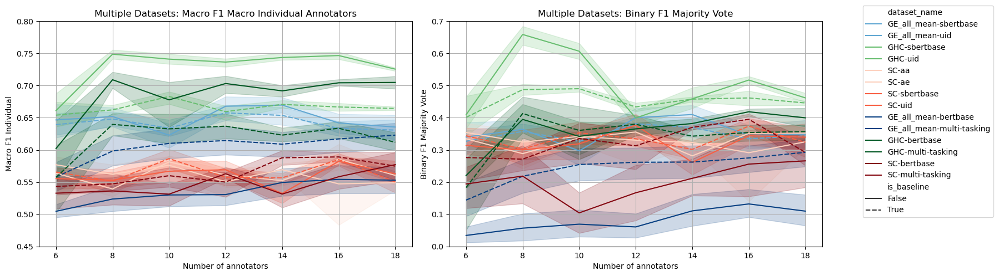

In [191]:
# this on GE, GHC and SC. 
# also, not the composite models
plot_f1s_multi_df(anno_scal_res_18_ge_avg, on_y='two', exclude_models_list=['anchor','downsized', 'comp','MD', 'ArMIS', 'ConvAbuse', 'HSBrexit'])

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/346521513.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


Text(784.1881313131312, 0.5, 'Binary F1')

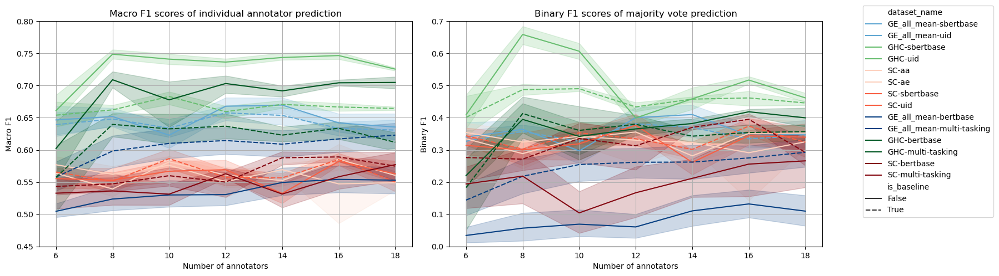

In [177]:
# EXAMPLE HOW TO EDIT PLOTS

fig, axs =  plot_f1s_multi_df(anno_scal_res_18_ge_avg, on_y='two', exclude_models_list=['anchor','downsized', 'comp','MD', 'ArMIS', 'ConvAbuse', 'HSBrexit'], return_plot=True)

axs[0].set_title('Macro F1 scores of individual annotator prediction')
axs[1].set_title('Binary F1 scores of majority vote prediction')

axs[0].set_xlabel('Number of annotators')
axs[1].set_xlabel('Number of annotators')

axs[0].set_ylabel('Macro F1')
axs[1].set_ylabel('Binary F1')

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4180747633.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


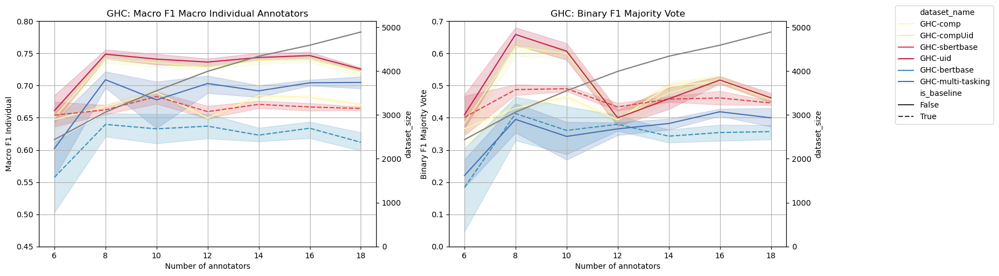

In [192]:
plot_f1s_multi_df(anno_scal_res_18_ge_avg, on_y='two', only_ds='GHC')

## 6 - 82 Annotators: GE, SC    NOTE: GE subsets are reduced to meet the SC subset sample sizes

In [193]:
anno_scal_res_82 = anno_scal_res_all[anno_scal_res_all['num_annos'] <= 82]

In [86]:
# mean of GE
anno_scal_res_82_ge_avg = remove_GE_emotion_from_name(anno_scal_res_82)

In [87]:
anno_scal_res_82_mean = get_means_of_folds(anno_scal_res_82_ge_avg)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4180747633.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


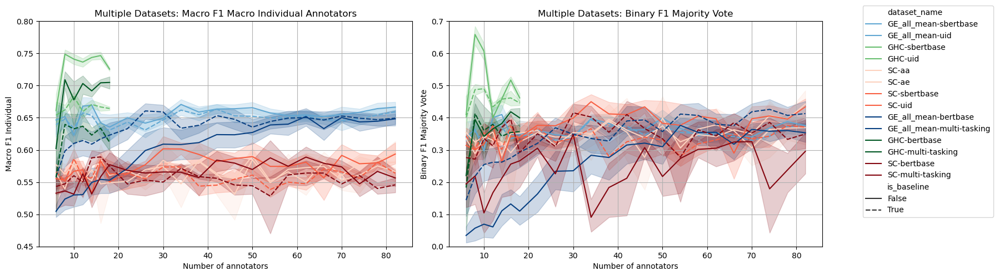

In [198]:
# again not composite and just GE, GHC, SC
plot_f1s_multi_df(anno_scal_res_82_ge_avg, on_y='two', exclude_models_list=['anchor','downsized', 'comp','MD', 'ArMIS', 'ConvAbuse', 'HSBrexit'])

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4180747633.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')
/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4180747633.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')
/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4180747633.py:2

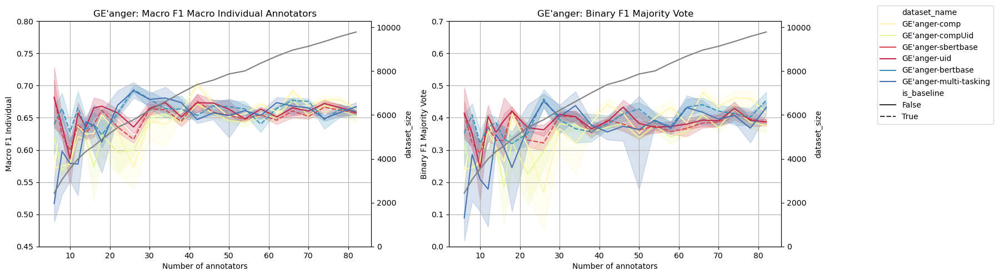

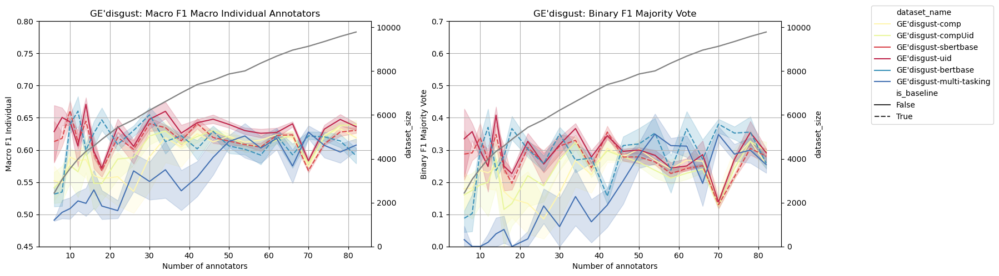

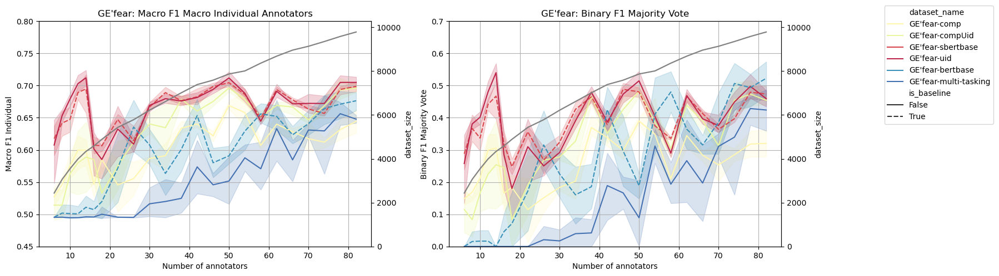

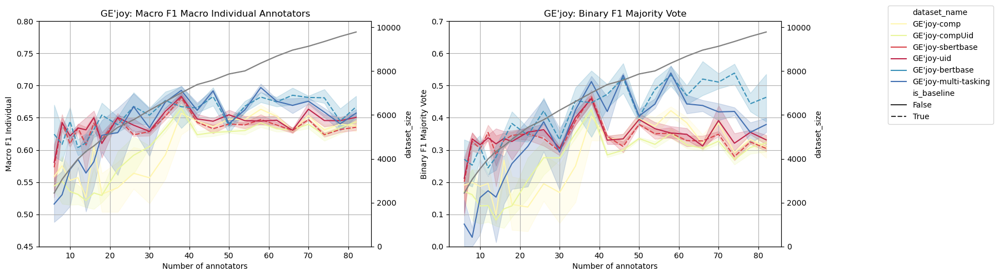

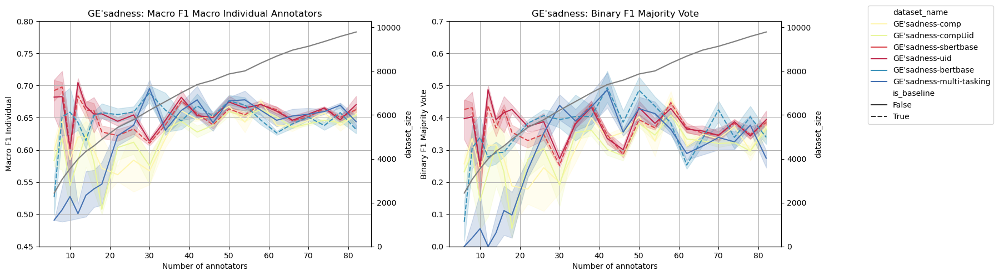

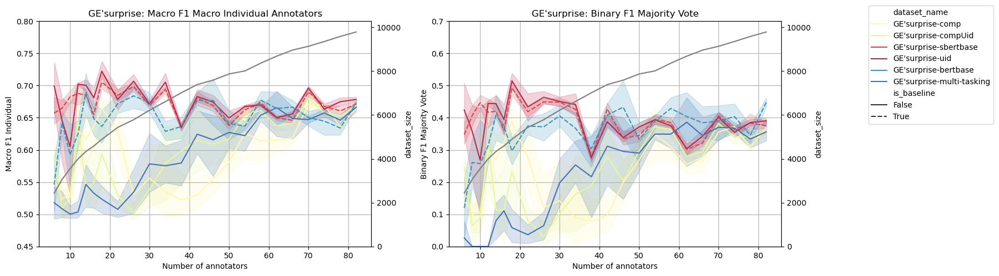

In [199]:
for emotion in emotions:
    plot_f1s_multi_df(anno_scal_res_82, on_y='two', only_ds=f"GE'{emotion}")

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4180747633.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


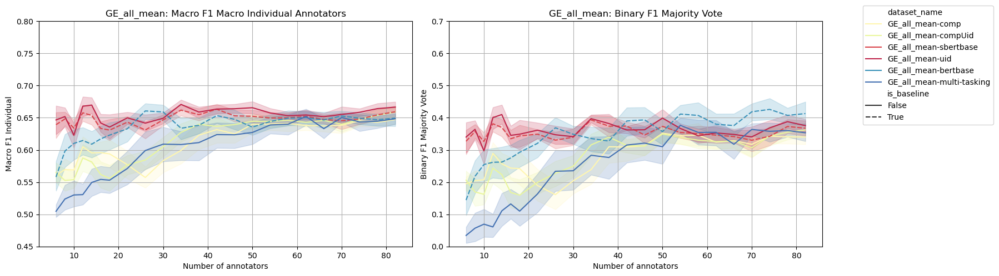

In [200]:
plot_f1s_multi_df(anno_scal_res_82_ge_avg, on_y='two', only_ds=f"GE_all_mean", plot_data_count=False)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4180747633.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


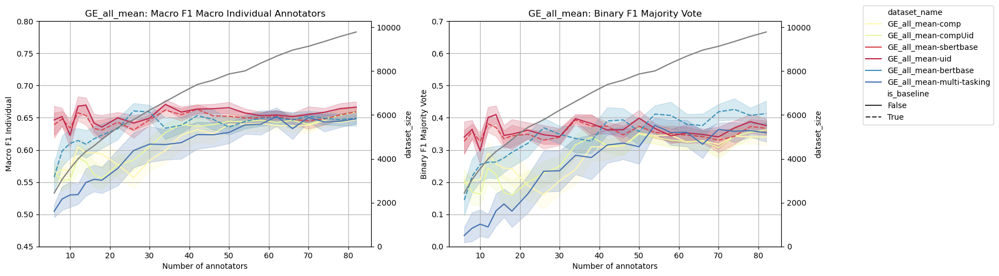

In [201]:
plot_f1s_multi_df(anno_scal_res_82_ge_avg, on_y='two', only_ds=f"GE_all_mean")

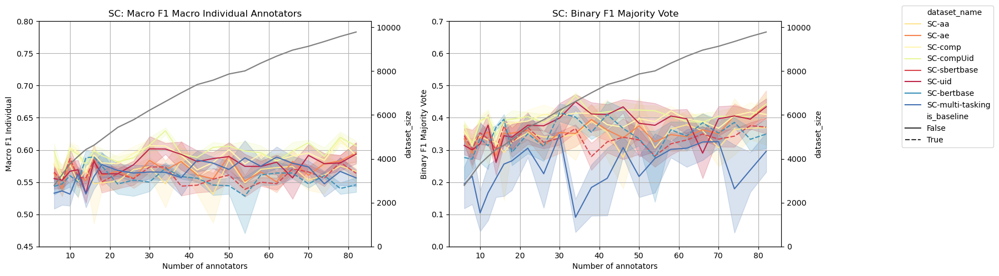

In [202]:
plot_f1s_multi_df(anno_scal_res_82_ge_avg, on_y='two', only_ds='SC', exclude_models_list=['anchor','downsized'])

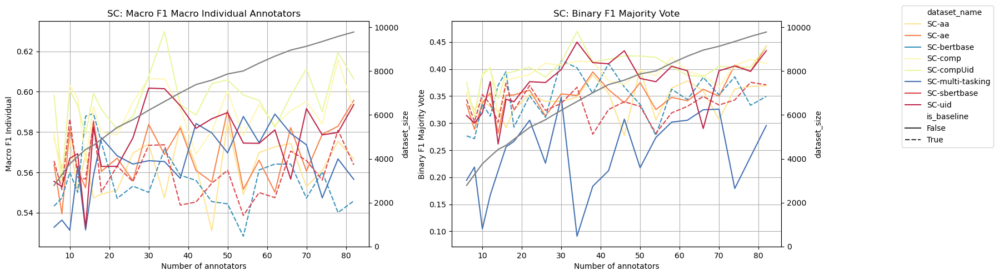

In [203]:
plot_f1s_multi_df(anno_scal_res_82_mean, on_y='two', only_ds='SC', exclude_models_list=['anchor','downsized'], fixed_y_axis=False)

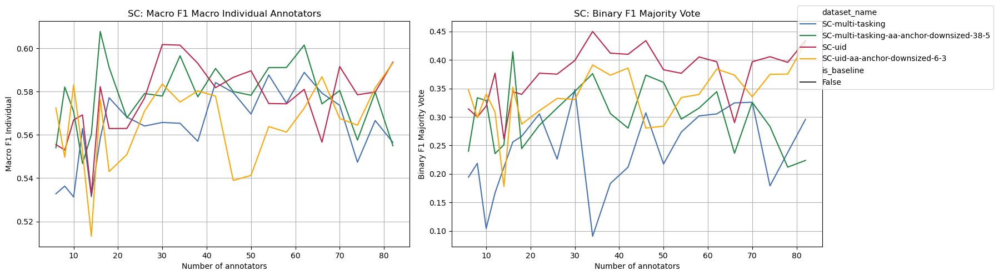

In [206]:
plot_f1s_multi_df(anno_scal_res_82_mean, on_y='two', only_ds='SC',fixed_y_axis=False, color_schema_auto=False, plot_data_count=False, select_models_list=['multi-tasking','uid'], exclude_models_list=['multi-tasking-downsized','comp','logits', 'multi-tasking-aa-anchor-downsized-6'])

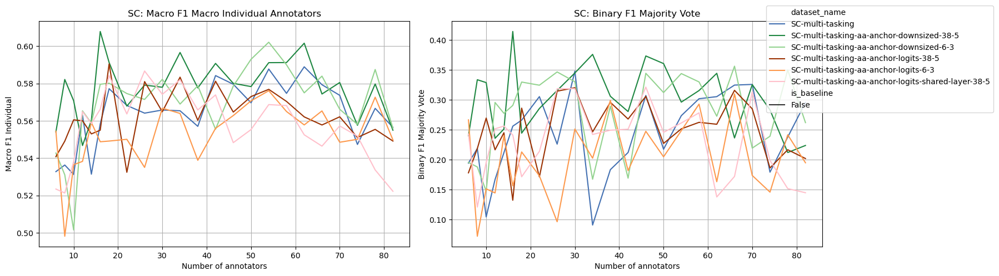

In [207]:
plot_f1s_multi_df(anno_scal_res_82_mean, on_y='two', only_ds='SC',fixed_y_axis=False, color_schema_auto=False, select_models_list=['multi-tasking'], exclude_models_list=['multi-tasking-downsized','comp'], plot_data_count=False)

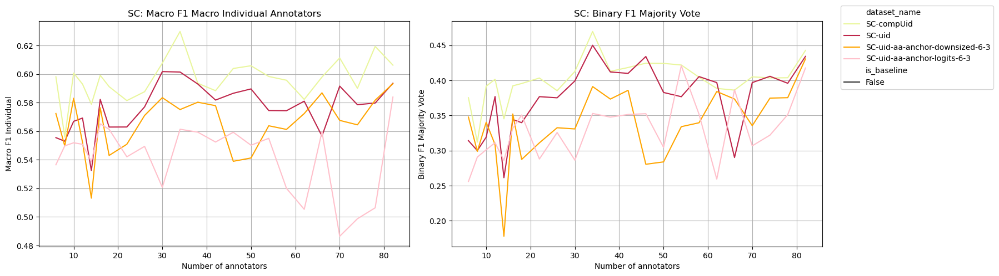

In [208]:
plot_f1s_multi_df(anno_scal_res_82_mean, on_y='two', only_ds='SC',fixed_y_axis=False, color_schema_auto=False, select_models_list=['uid'], exclude_models_list=['comp'], plot_data_count=False)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4180747633.py:246: UserWarning: 
The palette list has fewer values (10) than needed (11) and will cycle, which may produce an uninterpretable plot.
  lnplt = sns.lineplot(data=multi_res_df, x=list(multi_res_df[on_x]), y=list(multi_res_df[on_y]), hue='dataset_name' ,style=line_style, palette=colors, ax=axs[i])
/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4180747633.py:246: UserWarning: 
The palette list has fewer values (10) than needed (11) and will cycle, which may produce an uninterpretable plot.
  lnplt = sns.lineplot(data=multi_res_df, x=list(multi_res_df[on_x]), y=list(multi_res_df[on_y]), hue='dataset_name' ,style=line_style, palette=colors, ax=axs[i])


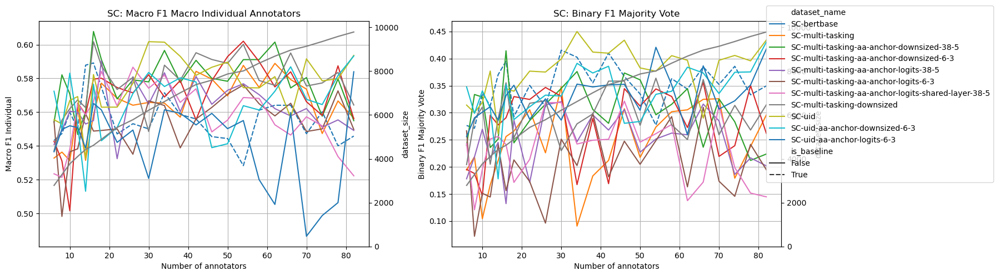

In [210]:
plot_f1s_multi_df(anno_scal_res_82_mean, on_y='two', only_ds='SC',fixed_y_axis=False, color_schema_auto=True, select_models_list=['multi-tasking','uid','sc-bert'], exclude_models_list=['basic', '12','comp'])

## 6 - 18 Annotators: GHC: FULL (sample sizes of subsets not reduced)

In [322]:
# anno_scal_res_all_ghc_full, missing_ge_full = get_all_res_as_df(82, 
#                                                                only_df='GHC', 
#                                                                path_to_models_runs='../results/ge_ghc_full_ds_scalability/') # sc are old runs

# anno_scal_res_all_ghc_full.to_csv('dataframes_for_plots/ghc_full_scal_annos_res.csv')

In [323]:
anno_scal_res_all_ghc_full = pd.read_csv('dataframes_for_plots/ghc_full_scal_annos_res.csv')

In [324]:
anno_scal_res_all_ghc_full_mean = get_means_of_folds(anno_scal_res_all_ghc_full)

In [366]:
anno_scal_res_all_ghc_full_mean[anno_scal_res_all_ghc_full_mean.num_annos==18][['dataset_name','num_annos','f1_macro_indi']]

,dataset_name,num_annos,f1_macro_indi
6,GHC-bertbase,18,0.627379
13,GHC-comp,18,0.682358
20,GHC-compUid,18,0.763954
27,GHC-multi-tasking,18,0.705029
34,GHC-sbertbase,18,0.685839
41,GHC-uid,18,0.764918


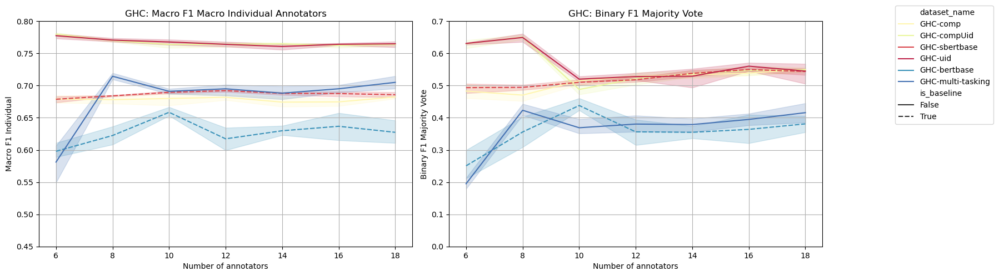

In [325]:
plot_f1s_multi_df(anno_scal_res_all_ghc_full, on_y='two', only_ds='GHC', plot_data_count=False)

## 6 - 82 Annotators: GE: FULL (samples sizes of subsets not reduced to meet the corresponding SC subset sizes)

In [214]:
# anno_scal_res_all_ge_full, missing_ge_full = get_all_res_as_df(82, 
#                                                                only_df='GE', 
#                                                                path_to_models_runs='../results/ge_ghc_full_ds_scalability/') # sc are old runs

# anno_scal_res_all_ge_full.to_csv('dataframes_for_plots/ge_full_scal_annos_res.csv')

In [215]:
anno_scal_res_all_ge_full = pd.read_csv('dataframes_for_plots/ge_full_scal_annos_res.csv')

In [367]:
anno_scal_res_all_ge_full_mean_individual_emotions = get_means_of_folds(anno_scal_res_all_ge_full)
anno_scal_res_all_ge_full_mean_individual_emotions[anno_scal_res_all_ge_full_mean_individual_emotions.num_annos==82][['dataset_name','num_annos','f1_macro_indi']]

,dataset_name,num_annos,f1_macro_indi
22,GE'anger-bertbase,82,0.666469
45,GE'anger-comp,82,0.662641
68,GE'anger-compUid,82,0.690699
91,GE'anger-multi-tasking,82,0.677792
114,GE'anger-sbertbase,82,0.678951
137,GE'anger-uid,82,0.695785
160,GE'disgust-bertbase,82,0.627717
183,GE'disgust-comp,82,0.636194
206,GE'disgust-compUid,82,0.662699
229,GE'disgust-multi-tasking,82,0.640166


In [216]:
# mean of GE
anno_scal_res_all_ge_full_avg = remove_GE_emotion_from_name(anno_scal_res_all_ge_full)

In [217]:
anno_scal_res_all_ge_full_mean = get_means_of_folds(anno_scal_res_all_ge_full_avg)

In [355]:
anno_scal_res_all_ge_full_mean[anno_scal_res_all_ge_full_mean.num_annos==82][['dataset_name','num_annos','f1_macro_indi']]

,dataset_name,num_annos,f1_macro_indi
22,GE_all_mean-bertbase,82,0.680341
45,GE_all_mean-comp,82,0.681648
68,GE_all_mean-compUid,82,0.699124
91,GE_all_mean-multi-tasking,82,0.682596
114,GE_all_mean-sbertbase,82,0.686343
137,GE_all_mean-uid,82,0.702291


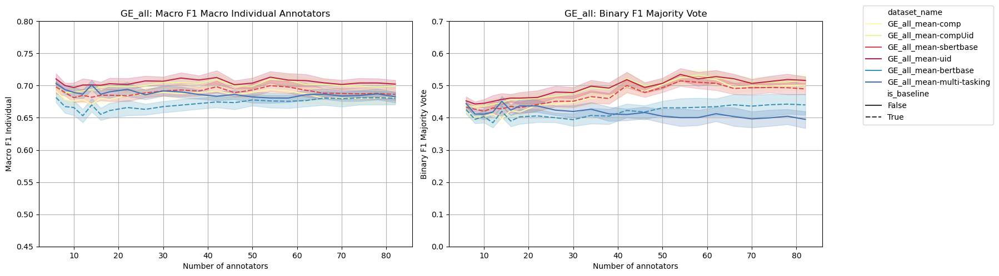

In [218]:
plot_f1s_multi_df(anno_scal_res_all_ge_full_avg, on_y='two', only_ds='GE_all', plot_data_count=False)

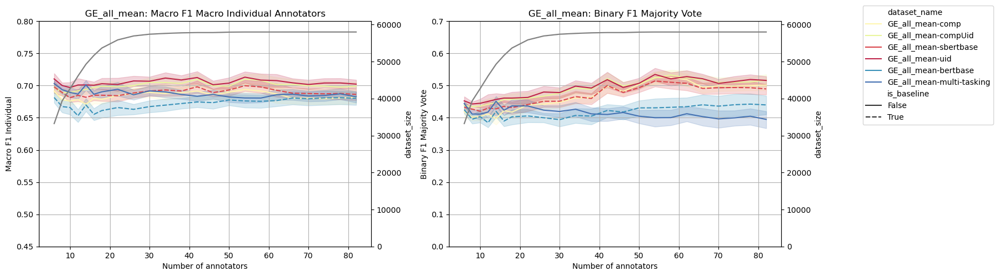

In [219]:
plot_f1s_multi_df(anno_scal_res_all_ge_full_avg, on_y='two', only_ds=f"GE_all_mean")

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4180747633.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')
/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4180747633.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')
/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4180747633.py:2

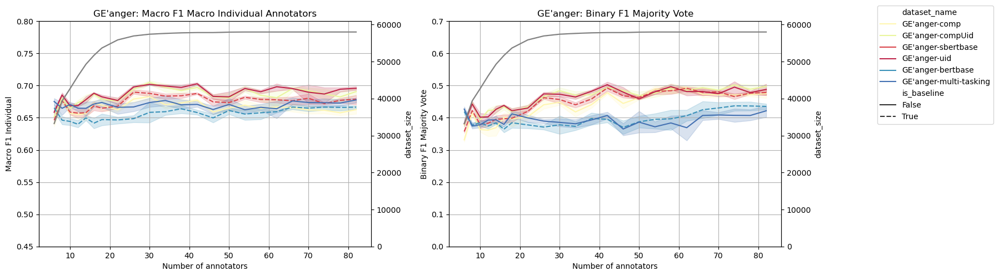

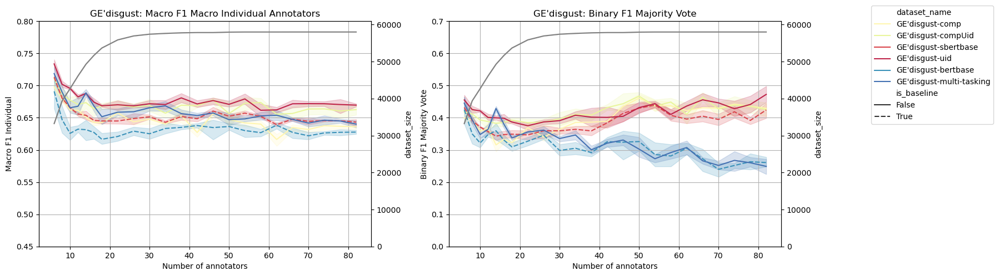

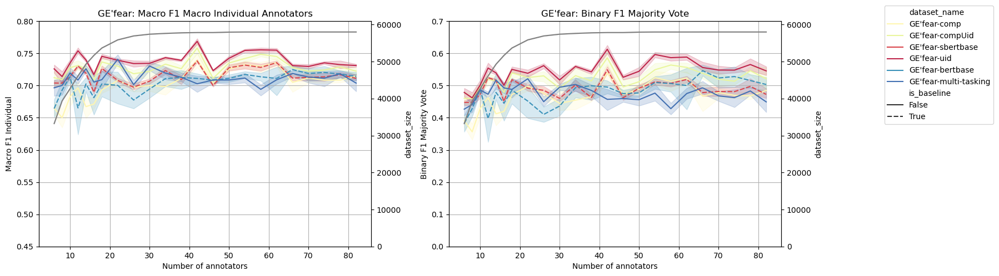

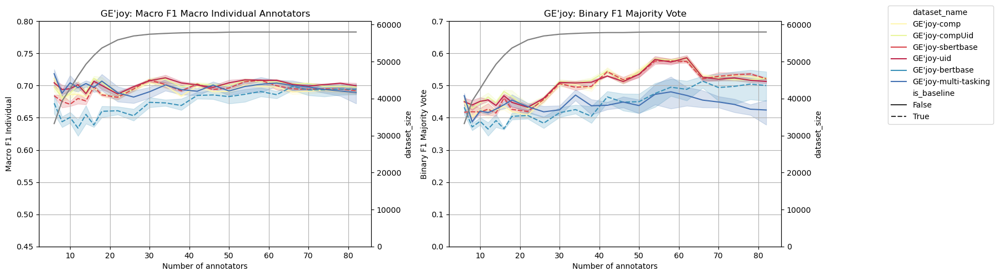

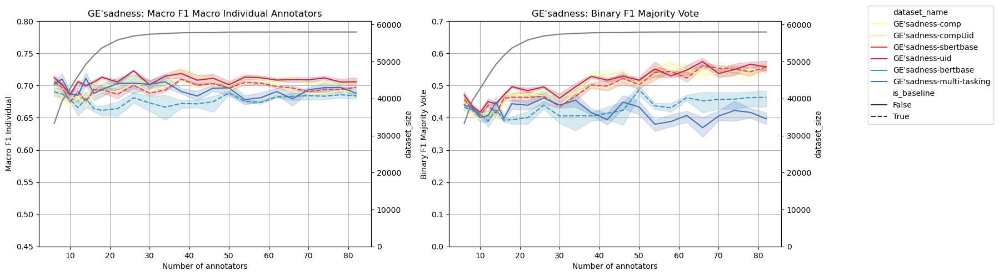

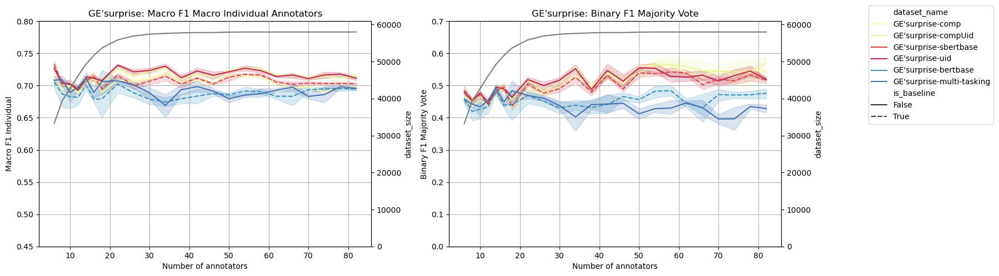

In [220]:
for emotion in emotions:
    plot_f1s_multi_df(anno_scal_res_all_ge_full, on_y='two', only_ds=f"GE'{emotion}")

## 82 - 2500 Annotators: SC:

In [230]:
anno_scal_res_2500 = anno_scal_res_all[(anno_scal_res_all['num_annos'] <= 2500) & (anno_scal_res_all['dataset_name'].str.contains('SC'))]

In [231]:
anno_scal_res_2500_mean = get_means_of_folds(anno_scal_res_2500)

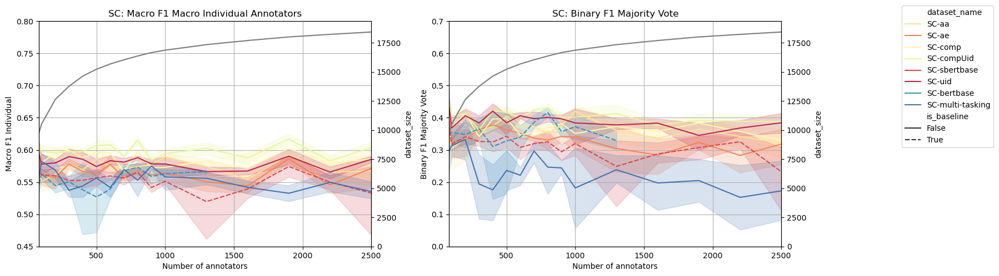

In [232]:
plot_f1s_multi_df(anno_scal_res_2500, on_y='two', only_ds='SC', set_x_range=(82,2500), exclude_models_list=['anchor', 'downsized'])

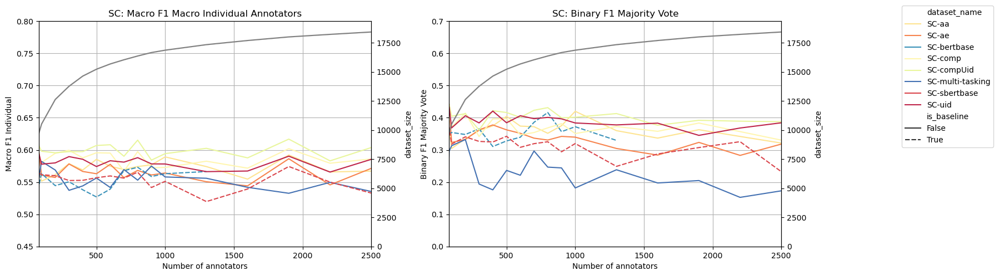

In [233]:
plot_f1s_multi_df(anno_scal_res_2500_mean, on_y='two', only_ds='SC', set_x_range=(82,2500), exclude_models_list=['anchor','downsized'])

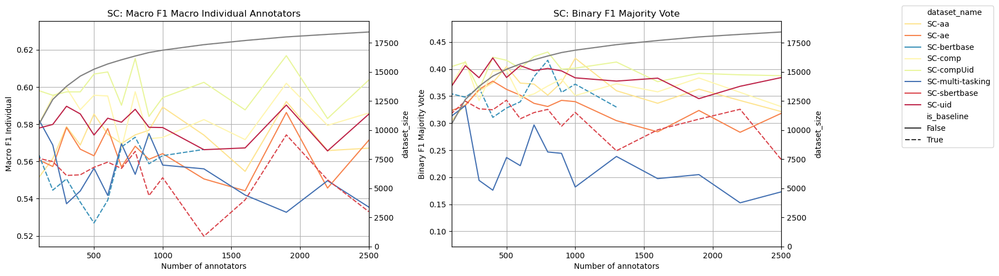

In [234]:
plot_f1s_multi_df(anno_scal_res_2500_mean, on_y='two', only_ds='SC', set_x_range=(100,2500), exclude_models_list=['anchor', 'downsized'], fixed_y_axis=False)

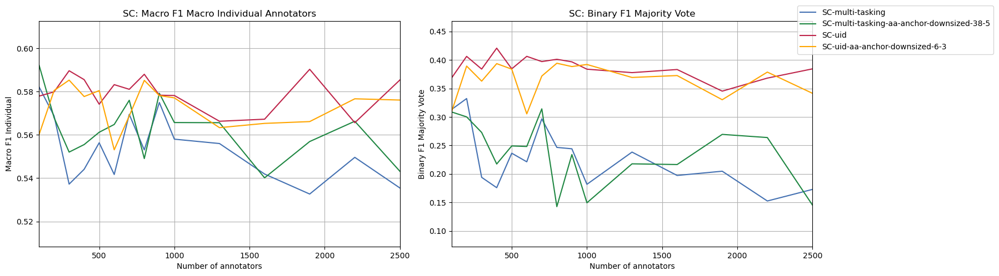

In [236]:
plot_f1s_multi_df(anno_scal_res_2500_mean, on_y='two', only_ds='SC',fixed_y_axis=False, no_style=True, color_schema_auto=False, set_x_range=(100,2500), plot_data_count=False, select_models_list=['multi-tasking','uid'], exclude_models_list=['multi-tasking-downsized','comp','logits', 'multi-tasking-aa-anchor-downsized-6'])

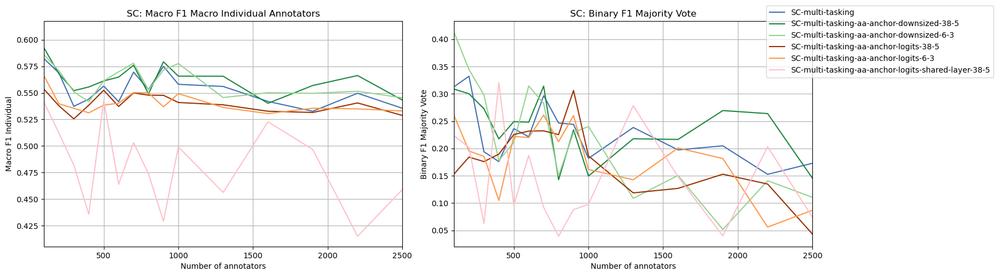

In [237]:
plot_f1s_multi_df(anno_scal_res_2500_mean, on_y='two', only_ds='SC',fixed_y_axis=False, no_style=True, color_schema_auto=False, set_x_range=(100,2500), select_models_list=['multi-tasking'], exclude_models_list=['multi-tasking-downsized'], plot_data_count=False)

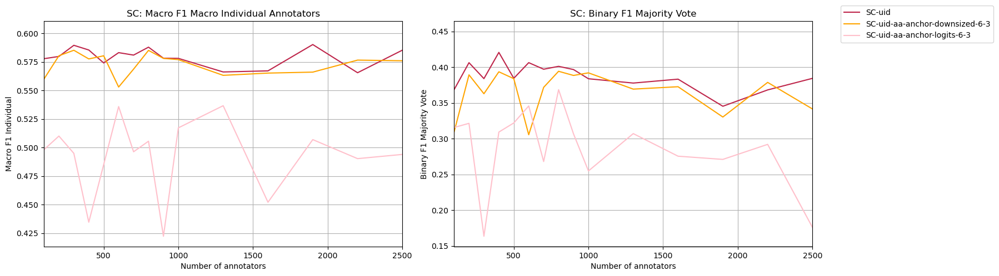

In [241]:
plot_f1s_multi_df(anno_scal_res_2500_mean, on_y='two', only_ds='SC',fixed_y_axis=False, no_style=True, color_schema_auto=False, set_x_range=(100,2500), select_models_list=['uid'], exclude_models_list=['comp'], plot_data_count=False)

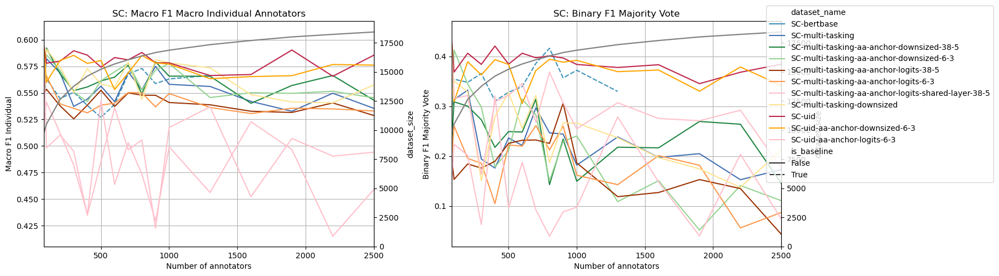

In [242]:
plot_f1s_multi_df(anno_scal_res_2500_mean, on_y='two', only_ds='SC',fixed_y_axis=False, set_x_range=(82,2500), color_schema_auto=False, select_models_list=['multi-tasking', 'uid', 'sc-bert'], exclude_models_list=['basic','12','comp'])

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/1323350806.py:391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[y_new] = df[y] / 1000 / 60


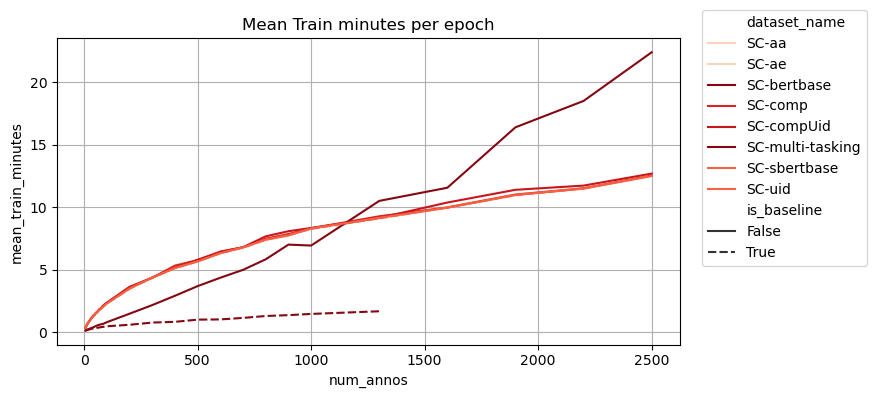

In [247]:
plot_train_time_multi_df(anno_scal_res_2500_mean, per='epoch', exclude_models_list=['anchor','downsized'])

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/1323350806.py:391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[y_new] = df[y] / 1000 / 60


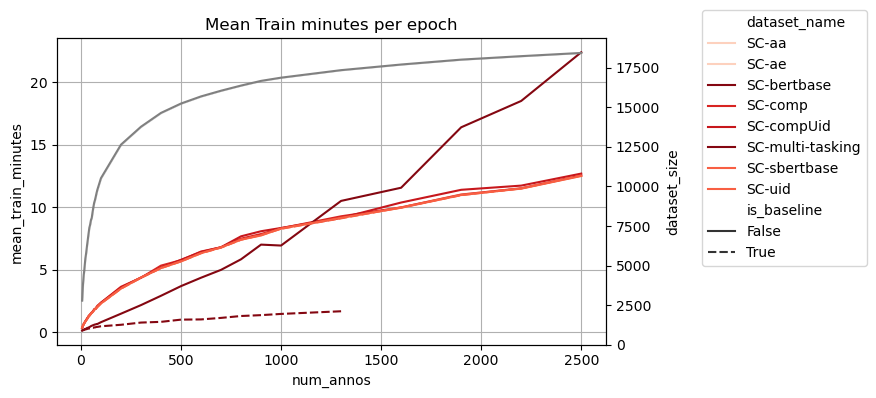

In [248]:
plot_train_time_multi_df(anno_scal_res_2500_mean, per='epoch', exclude_models_list=['anchor','downsized',], plot_data_count=True)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_17660/536405884.py:269: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['is_baseline'] = df.dataset_name.str.lower().str.contains('base')


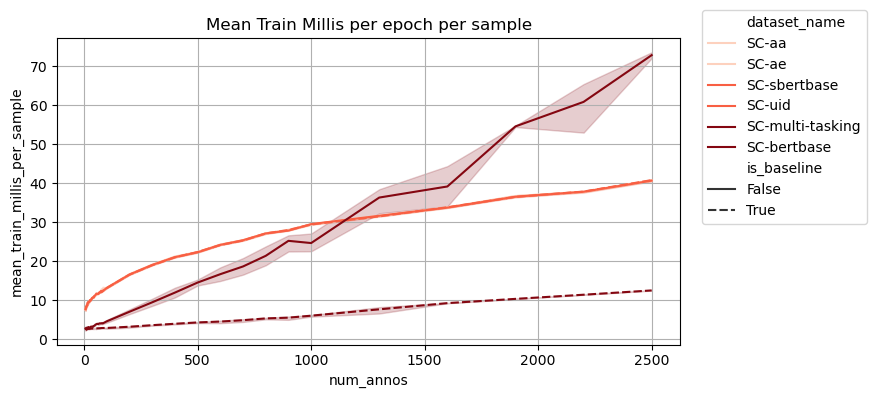

In [219]:
plot_train_time_multi_df(anno_scal_res_2500, per='sample', exclude_models_list=['anchor','down'])

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/1323350806.py:385: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[y_new] = df[y] / df['number_annotations']


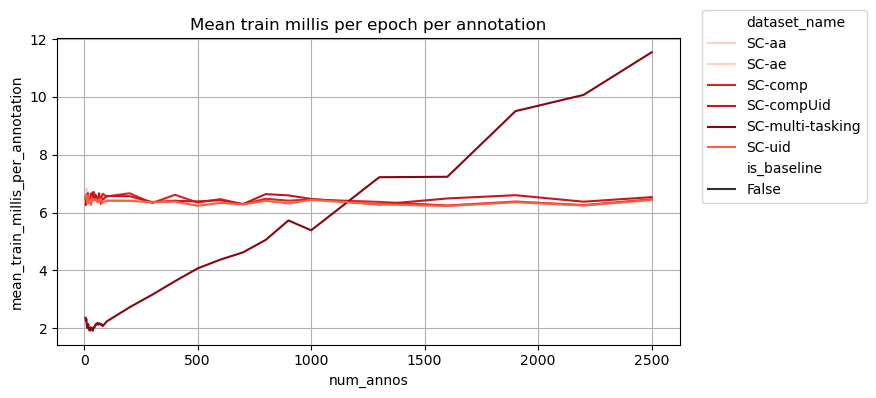

In [249]:
plot_train_time_multi_df(anno_scal_res_2500_mean, per='annotation', exclude_models_list=['anchor','downsized','bertbase'])

## 6 - 682 Multi-Domain

In [250]:
anno_scal_res_MD = anno_scal_res_all[(anno_scal_res_all['dataset_name'].str.contains('MD'))]

In [252]:
anno_scal_res_MD.head(3)

,Unnamed: 0,dataset_name,ds_name,model,dataset_size,number_annotations,num_annos,f1_bin_maj,f1_macro_maj,f1_bin_indi,...,mean_train_millis,mean_train_millis_per_annotation,mean_train_millis_per_sample,mean_eval_millis_per_annotation,mean_test_millis_per_annotation,sum_all_millis,annotations_per_anno,comment_percentage,learning_rate,fold
88,88,MD-comp,MD,comp,4937,6904,6,0.725941,0.759167,0.718081,...,8397.173168,1.216277,1.700866,0.425659,NaN,116412.713688,NaN,NaN,NaN,0
89,89,MD-compUid,MD,compUid,4937,6904,6,0.779147,0.789401,0.766161,...,7939.191501,1.149941,1.608100,0.413245,NaN,110947.068692,NaN,NaN,NaN,0
90,90,MD-sbertbase,MD,sbertbase,4937,6904,6,0.727855,0.764396,0.722467,...,8052.277280,1.166321,1.631006,0.434284,NaN,113570.479457,NaN,NaN,NaN,0


In [253]:
anno_scal_res_MD_mean = get_means_of_folds(anno_scal_res_MD)

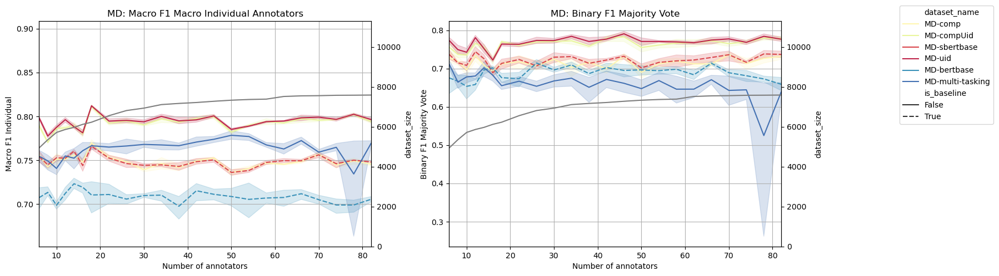

In [254]:
plot_f1s_multi_df(anno_scal_res_MD, only_ds='MD', on_y='two', fixed_y_axis=False, set_x_range=[6,82])

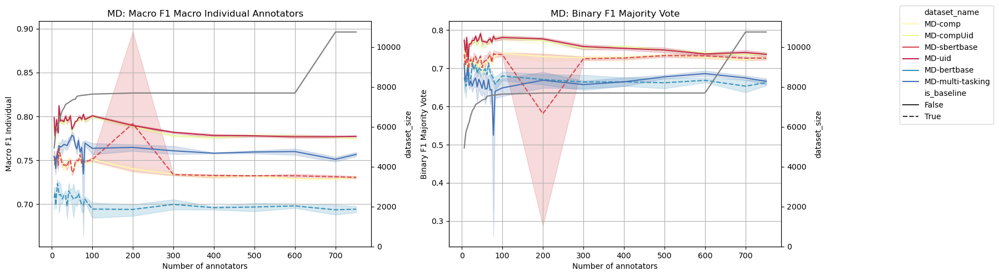

In [255]:
plot_f1s_multi_df(anno_scal_res_MD, only_ds='MD', on_y='two', fixed_y_axis=False)

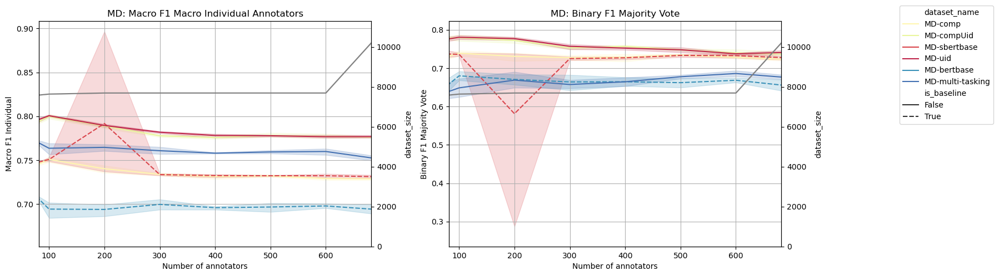

In [256]:
plot_f1s_multi_df(anno_scal_res_MD, only_ds='MD', on_y='two', fixed_y_axis=False, set_x_range=(82,682))

## 1 - 3 ArMIS

In [257]:
anno_scal_res_ArMIS = anno_scal_res_all[(anno_scal_res_all['dataset_name'].str.contains('ArMIS'))]

In [258]:
anno_scal_res_ArMIS_mean = get_means_of_folds(anno_scal_res_ArMIS)

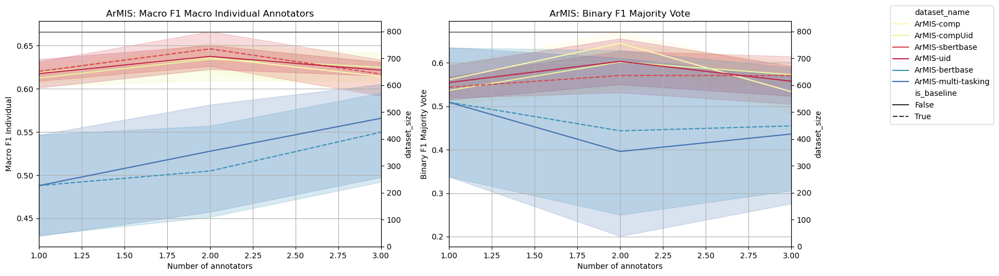

In [259]:
plot_f1s_multi_df(anno_scal_res_ArMIS, only_ds='ArMIS', on_y='two', fixed_y_axis=False, set_x_range=[1,3])

## 1 - 8 ConvAbuse

In [260]:
anno_scal_res_CA = anno_scal_res_all[(anno_scal_res_all['dataset_name'].str.contains('ConvAbuse'))]

In [261]:
anno_scal_res_CA_mean = get_means_of_folds(anno_scal_res_CA)

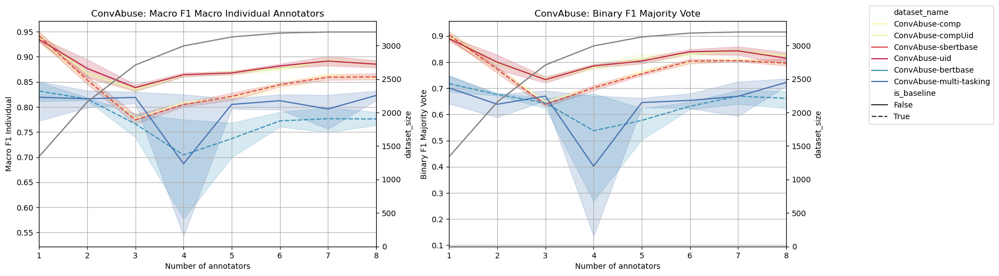

In [262]:
plot_f1s_multi_df(anno_scal_res_CA, only_ds='ConvAbuse', on_y='two', fixed_y_axis=False, set_x_range=[1,8])

## 1 - 6 HSBrexit

In [263]:
anno_scal_res_HSB = anno_scal_res_all[(anno_scal_res_all['dataset_name'].str.contains('HSBrexit'))]

In [264]:
anno_scal_res_HSB_mean = get_means_of_folds(anno_scal_res_HSB)

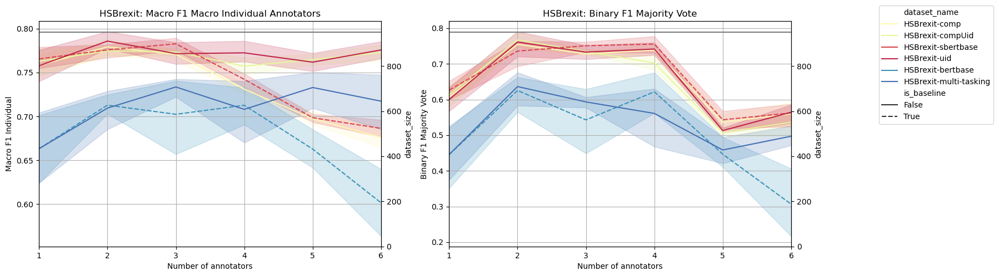

In [265]:
plot_f1s_multi_df(anno_scal_res_HSB, only_ds='HSBrexit', on_y='two', fixed_y_axis=False, set_x_range=[1,6])

# scaling number of annotations per annotator exploration

In [266]:
path_to_ge_ghc_data = f'../data/matching_sizes_data/'
path_to_multi_tasking_runs_comments_exploration = path_to_models_runs + 'SC_GE_GHC_comment_scalability/'

path_to_sc_data = '../data/sc_filtered_from_bela/'
path_to_personalization_runs_comments_exploration = '../../user_perception/results/comment_scalability/'

In [267]:
def get_runs(path, max_annos=None):
    runs = [run for run in os.listdir(path) if re.findall(r'\d+', run)]
    if max_annos:
        runs = [run for run in runs if int(re.findall(r'\d+', run)[1]) == max_annos]
    runs = sorted(runs, key=lambda run: (int(re.findall(r'\d+', run)[0]), run.split('_')[0]))
    return runs

## 14 Annotators: GE, GHC, SC, MD

In [271]:
# comment_scal_res_14, missing = get_all_res_as_df(14, comments='comment_', ignore_list=['multi-tasking-sbert'])
# comment_scal_res_14.to_csv('dataframes_for_plots/all_scal_comments_14_res.csv')


In [272]:
comment_scal_res_14 = pd.read_csv('dataframes_for_plots/all_scal_comments_14_res.csv')

In [273]:
# mean of GE
comment_scal_res_14_ge_avg = remove_GE_emotion_from_name(comment_scal_res_14, is_comment_df=True)

In [274]:
comment_scal_res_14_mean = get_means_of_folds(comment_scal_res_14_ge_avg, is_comments_df=True)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4272831518.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


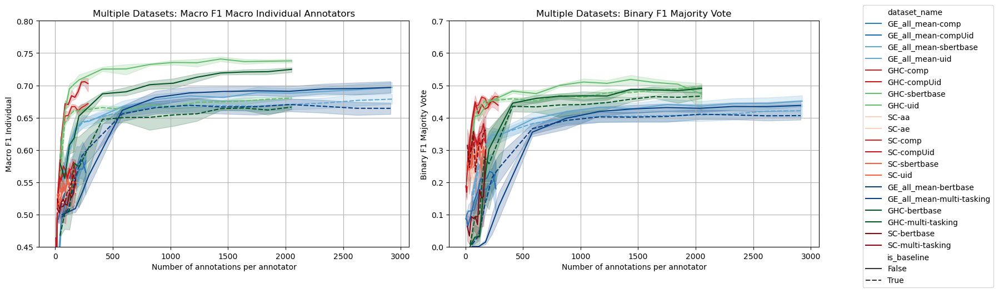

In [277]:
plot_f1s_multi_df(comment_scal_res_14_ge_avg, on_x='annotations_per_anno', on_y='two', exclude_models_list=['MD'])

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4272831518.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


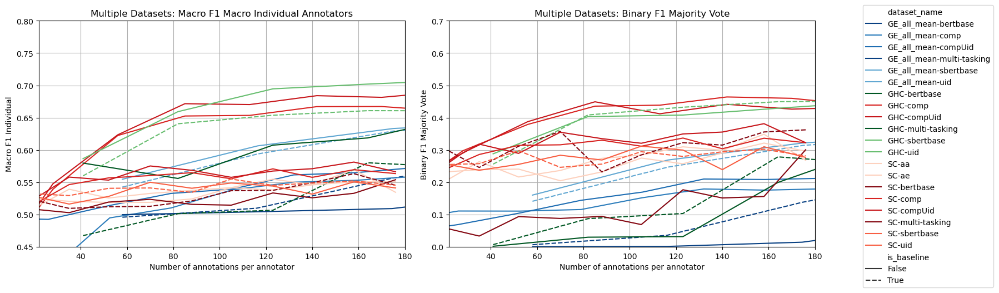

In [278]:
plot_f1s_multi_df(comment_scal_res_14_mean, on_x='annotations_per_anno', on_y='two', set_x_range=(22,180), exclude_models_list=['MD'])

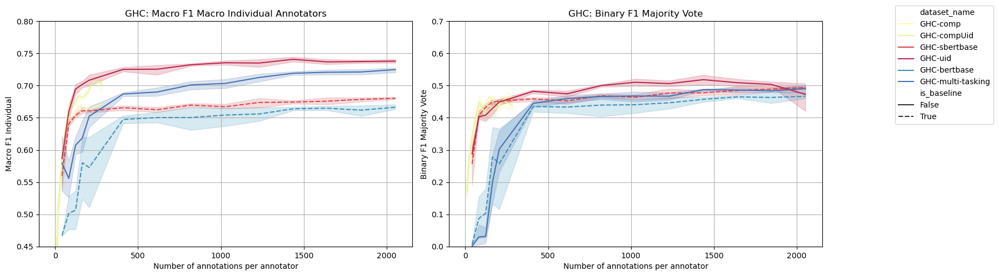

In [279]:
plot_f1s_multi_df(comment_scal_res_14_ge_avg, on_x='annotations_per_anno', on_y='two', only_ds='GHC', plot_data_count=False, exclude_models_list=['MD'])

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4272831518.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


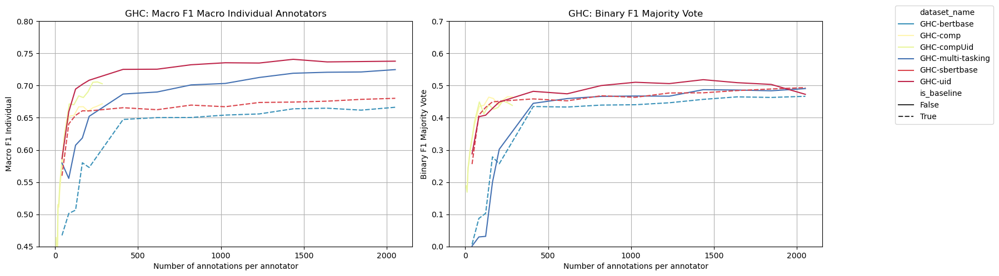

In [280]:
plot_f1s_multi_df(comment_scal_res_14_mean, on_x='annotations_per_anno', on_y='two', only_ds='GHC', plot_data_count=False)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/820433345.py:255: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  lnplt = sns.lineplot(data=multi_res_df, x=list(multi_res_df[on_x]), y=list(multi_res_df[on_y]), hue='dataset_name' ,style=line_style, palette=colors, ax=axs[i])
/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/820433345.py:255: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  lnplt = sns.lineplot(data=multi_res_df, x=list(multi_res_df[on_x]), y=list(multi_res_df[on_y]), hue='dataset_name' ,style=line_style, palette=colors, ax=axs[i])


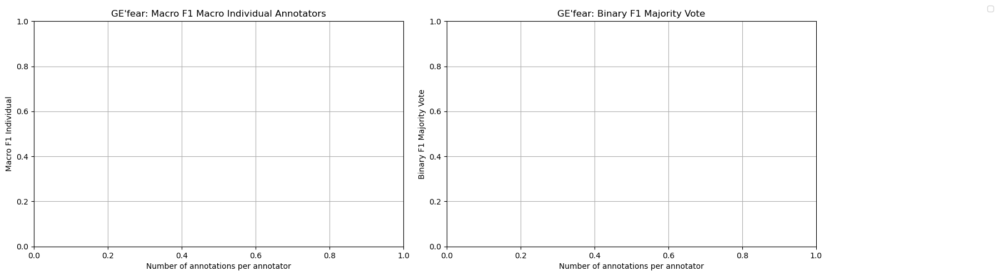

In [304]:
plot_f1s_multi_df(comment_scal_res_14, 
                      on_x='annotations_per_anno', 
                      on_y='two', 
                      only_ds=f"GE'fear", 
                      plot_data_count=False,
                      fixed_y_axis=False,
                      select_models_list=['comp'])

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4272831518.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')
/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4272831518.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')
/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4272831518.py:2

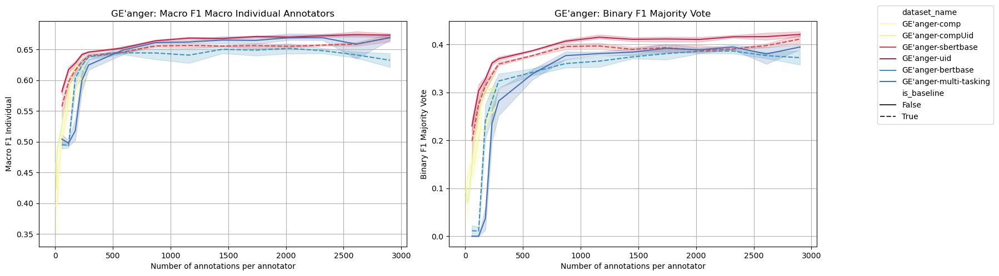

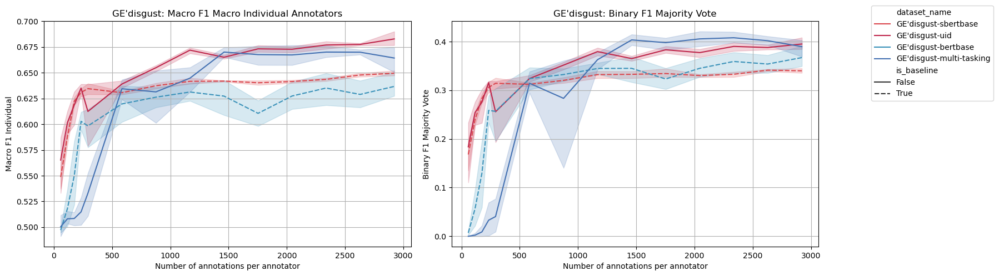

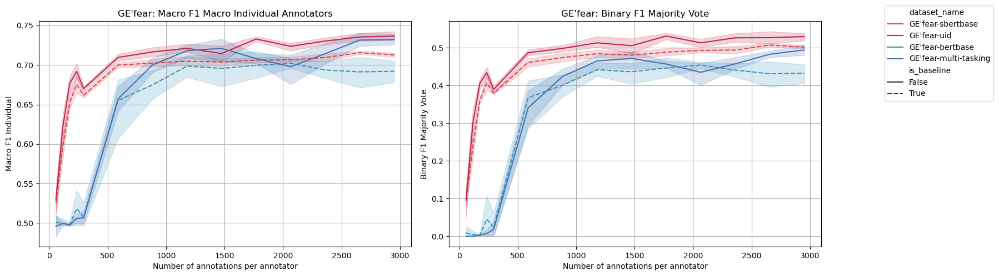

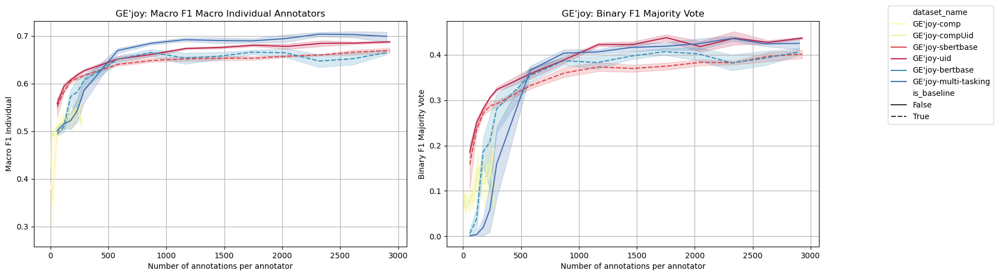

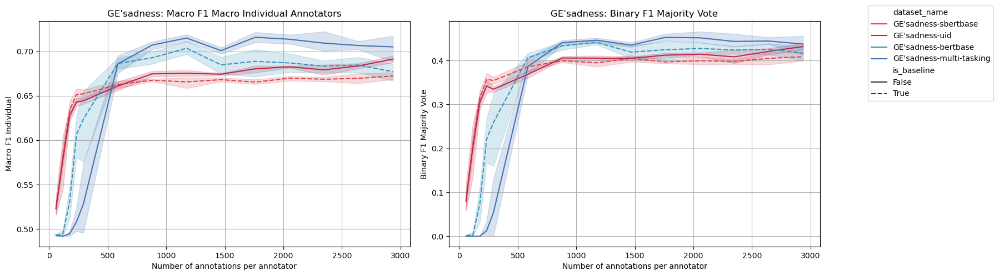

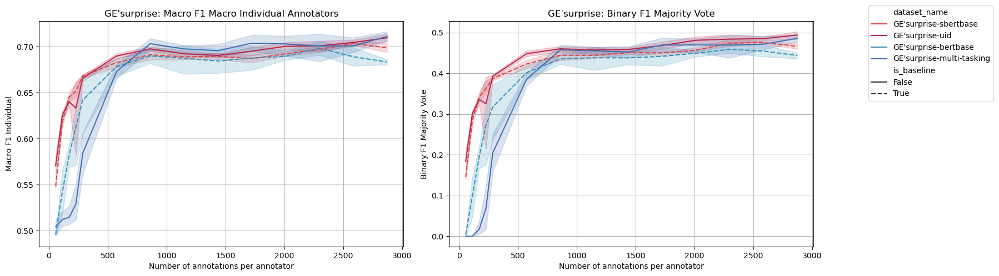

In [282]:
for emotion in emotions:
    plot_f1s_multi_df(comment_scal_res_14, 
                      on_x='annotations_per_anno', 
                      on_y='two', 
                      only_ds=f"GE'{emotion}", 
                      plot_data_count=False,
                      fixed_y_axis=False)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4272831518.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


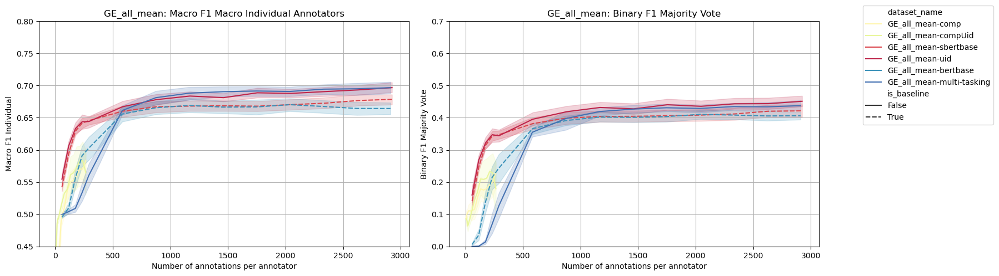

In [288]:
plot_f1s_multi_df(comment_scal_res_14_ge_avg, on_x='annotations_per_anno', on_y='two', only_ds=f"GE_all_mean", plot_data_count=False)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4272831518.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


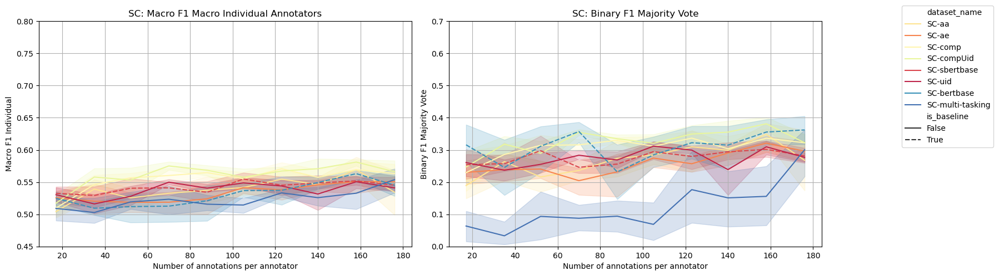

In [289]:
plot_f1s_multi_df(comment_scal_res_14, on_x='annotations_per_anno', on_y='two', only_ds='SC', plot_data_count=False)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4272831518.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


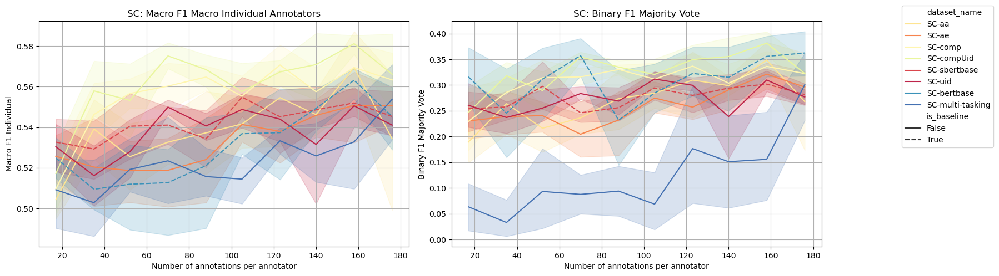

In [290]:
plot_f1s_multi_df(comment_scal_res_14, on_x='annotations_per_anno', on_y='two', only_ds='SC', fixed_y_axis=False, plot_data_count=False)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4272831518.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


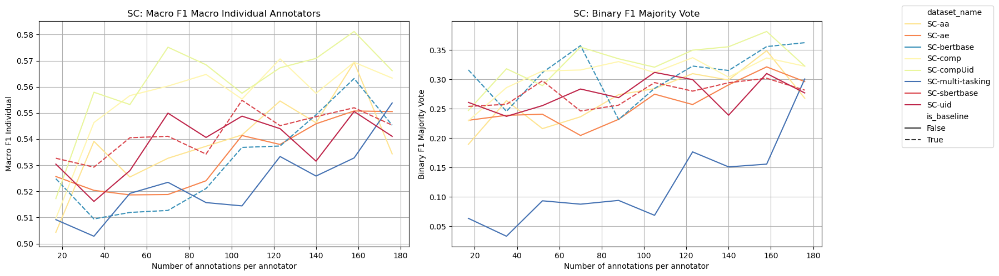

In [294]:
plot_f1s_multi_df(comment_scal_res_14_mean, on_x='annotations_per_anno', on_y='two', only_ds='SC', fixed_y_axis=False, plot_data_count=False)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/4272831518.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


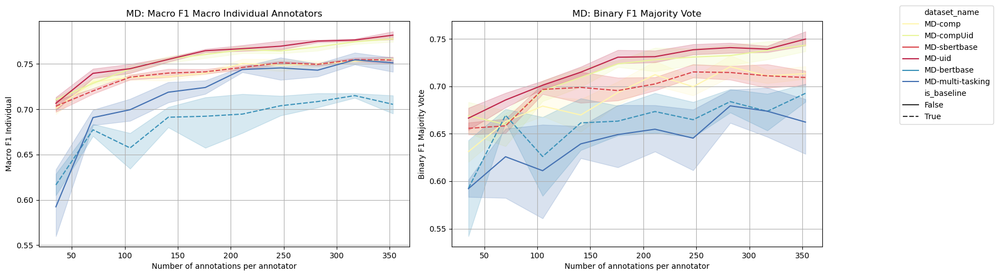

In [295]:
plot_f1s_multi_df(comment_scal_res_14, on_x='annotations_per_anno', on_y='two', only_ds='MD', fixed_y_axis=False, plot_data_count=False)

## 50 Annotators: GE, SC, MD

In [296]:
# comment_scal_res_50, missing = get_all_res_as_df(50, comments='comment_', ignore_list=['multi-tasking-sbert'])
# comment_scal_res_50.to_csv('dataframes_for_plots/all_scal_comments_50_res.csv')


In [297]:
comment_scal_res_50 = pd.read_csv('dataframes_for_plots/all_scal_comments_50_res.csv')

In [298]:
# mean of GE
comment_scal_res_50_ge_avg = remove_GE_emotion_from_name(comment_scal_res_50, is_comment_df=True)

In [299]:
comment_scal_res_50_mean = get_means_of_folds(comment_scal_res_50_ge_avg, is_comments_df=True)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/820433345.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


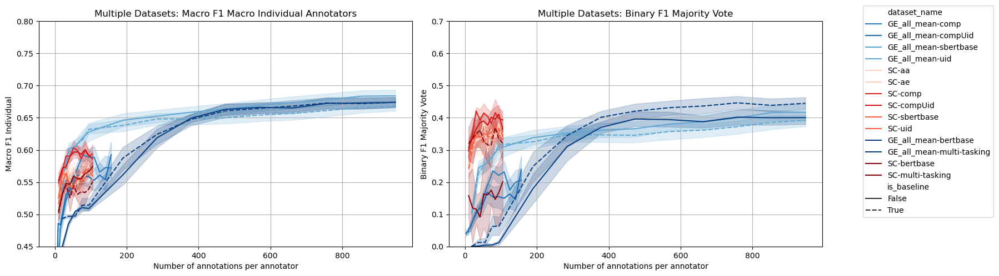

In [305]:
plot_f1s_multi_df(comment_scal_res_50_ge_avg, on_x='annotations_per_anno', on_y='two', exclude_models_list=['MD'])

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/820433345.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


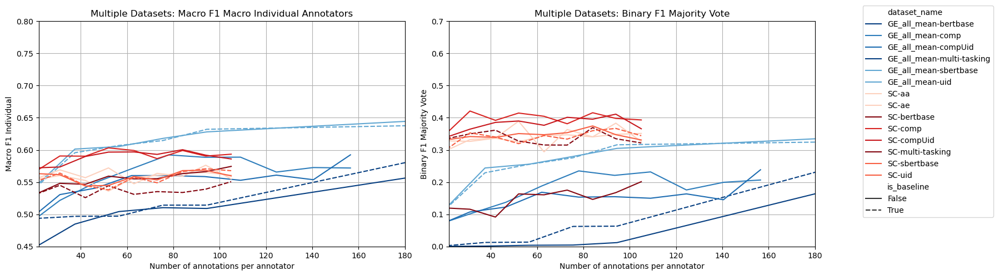

In [306]:
plot_f1s_multi_df(comment_scal_res_50_mean, on_x='annotations_per_anno', on_y='two', set_x_range=(22,180), exclude_models_list=['MD'])

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/820433345.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')
/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/820433345.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')
/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/820433345.py:224:

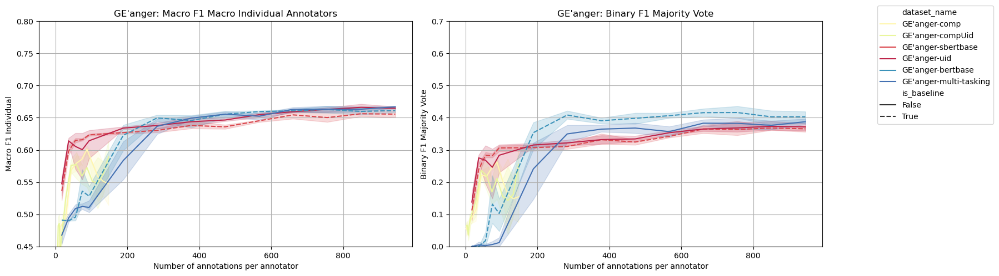

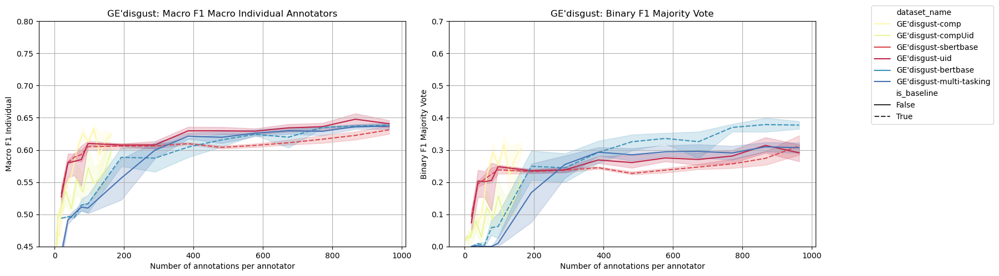

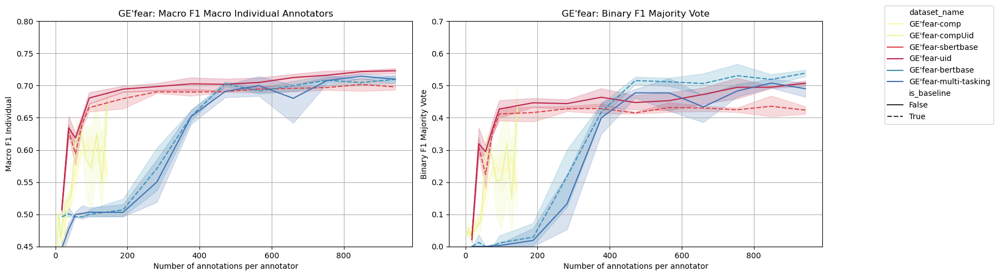

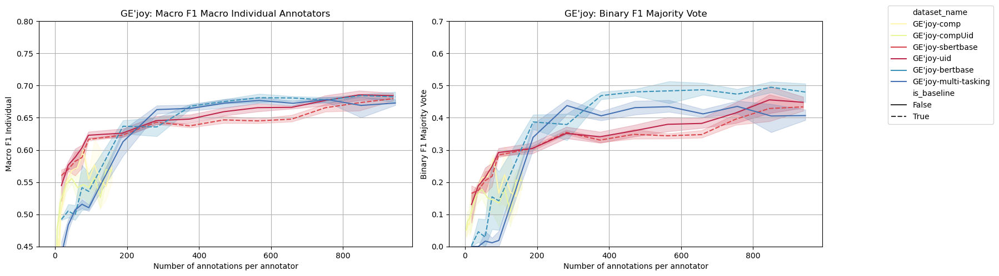

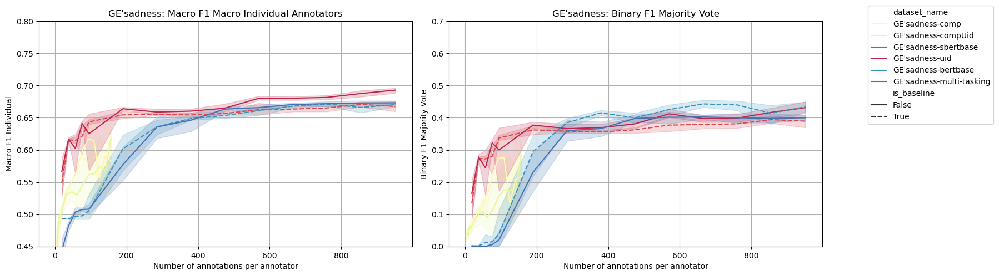

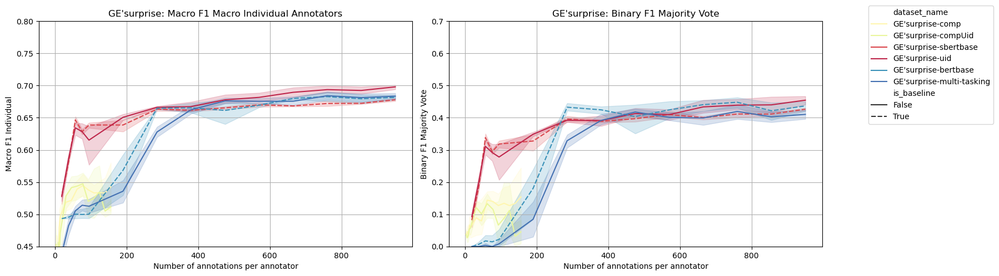

In [308]:
for emotion in emotions:
    plot_f1s_multi_df(comment_scal_res_50, on_x='annotations_per_anno', on_y='two', only_ds=f"GE'{emotion}", plot_data_count=False)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/820433345.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


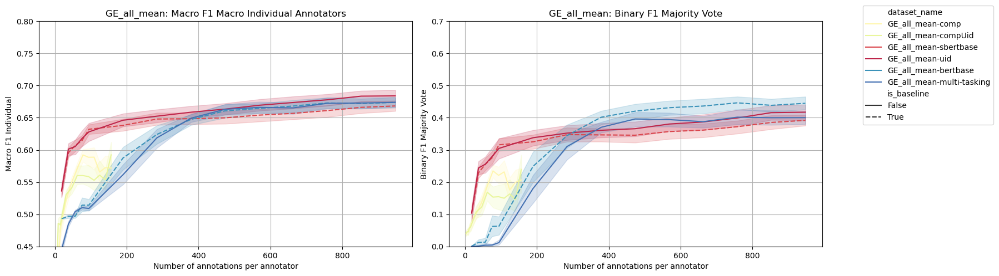

In [309]:
plot_f1s_multi_df(comment_scal_res_50_ge_avg, on_x='annotations_per_anno', on_y='two', only_ds=f"GE_all_mean", plot_data_count=False)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/820433345.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


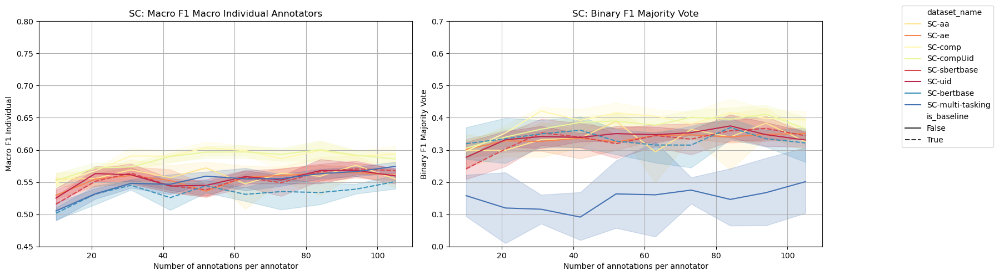

In [310]:
plot_f1s_multi_df(comment_scal_res_50, on_x='annotations_per_anno', on_y='two', only_ds='SC', plot_data_count=False)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/820433345.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


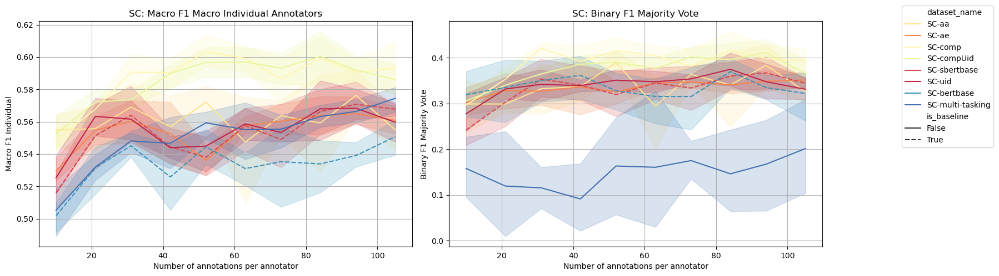

In [311]:
plot_f1s_multi_df(comment_scal_res_50, on_x='annotations_per_anno', on_y='two', only_ds='SC', fixed_y_axis=False, plot_data_count=False)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/820433345.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


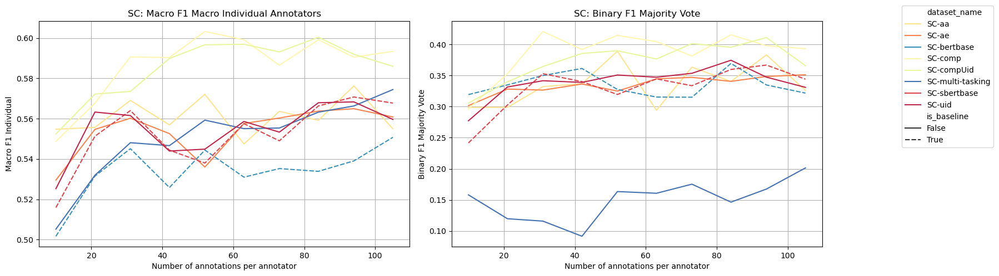

In [313]:
plot_f1s_multi_df(comment_scal_res_50_mean, on_x='annotations_per_anno', on_y='two', only_ds='SC', fixed_y_axis=False, plot_data_count=False)

/var/folders/5w/704vgpg533lchz5h0y4zwhfc0000gn/T/ipykernel_281/820433345.py:224: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multi_res_df['is_baseline'] = multi_res_df.dataset_name.str.lower().str.contains('base')


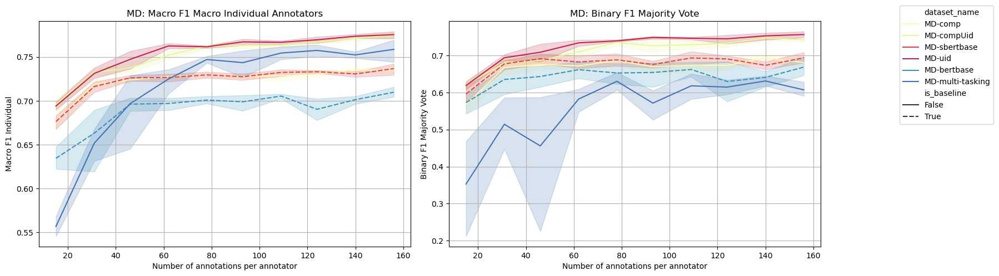

In [312]:
plot_f1s_multi_df(comment_scal_res_50, on_x='annotations_per_anno', on_y='two', only_ds='MD', fixed_y_axis=False, plot_data_count=False)

## HSBrexit

### 6 Annos

In [314]:
HSB_explo_res_14, missing = get_all_res_as_df(6, comments='comment_', only_df='HSBrexit')

In [315]:
HSB_explo_res_14_mean = get_means_of_folds(HSB_explo_res_14.drop(columns=['model','ds_name']), is_comments_df=True)

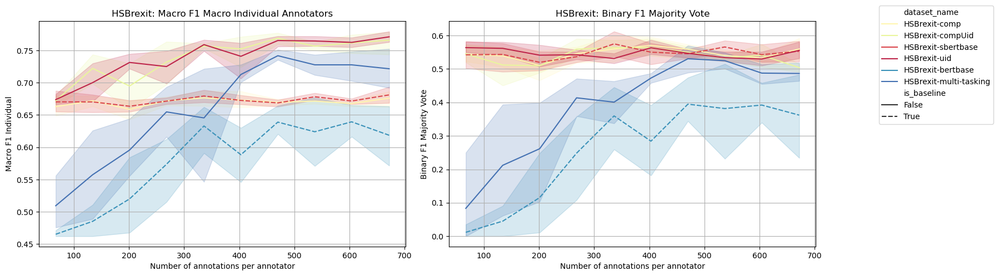

In [316]:
plot_f1s_multi_df(HSB_explo_res_14, only_ds='HSBrexit', on_x='annotations_per_anno', on_y='two', plot_data_count=False, fixed_y_axis=False)

## ConvAbuse

### 7 Annos
7 and not 8 because of lack of data for 8

In [317]:
CA_explo_res_14, missing = get_all_res_as_df(7, comments='comment_', only_df='ConvAbuse')

In [318]:
CA_explo_res_14_mean = get_means_of_folds(CA_explo_res_14.drop(columns=['model','ds_name']), is_comments_df=True)

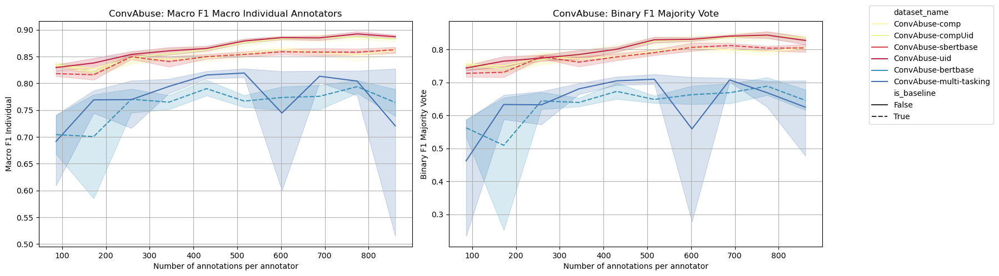

In [319]:
plot_f1s_multi_df(CA_explo_res_14, only_ds='ConvAbuse', on_x='annotations_per_anno', on_y='two', plot_data_count=False, fixed_y_axis=False)

## ArMIS

### 3 Annos

In [320]:
ArMIS_explo_res_14, missing = get_all_res_as_df(3, comments='comment_', only_df='ArMIS')

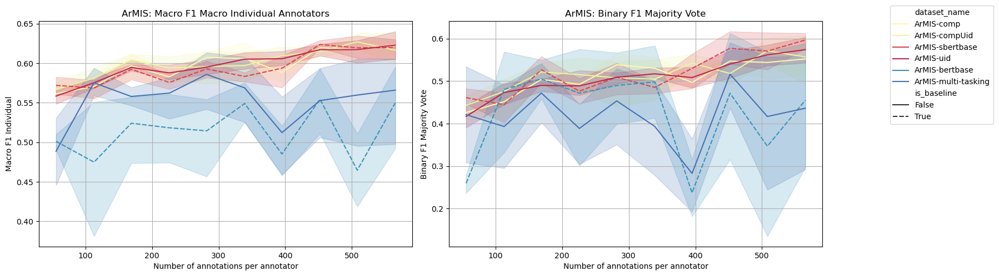

In [321]:
plot_f1s_multi_df(ArMIS_explo_res_14, only_ds='ArMIS', on_x='annotations_per_anno', on_y='two', plot_data_count=False, fixed_y_axis=False)